In [1]:
import pandas as pd
import numpy as np
import os
import shutil
from tqdm import tqdm
from glob import glob
import librosa
import warnings
import seaborn as sns
import librosa.display
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

In [2]:
from IPython.display import Audio
from scipy.io import wavfile

### 데이터 불러오기

In [4]:
pwd

'C:\\Users\\enech\\OneDrive\\바탕 화면\\Master_Univ\\Project\\AI음성분류\\ETRI_competition\\code'

In [5]:
cd ..

C:\Users\enech\OneDrive\바탕 화면\Master_Univ\Project\AI음성분류\ETRI_competition


In [8]:
file_path = glob('./data/KEMDy20_v1_1/wav/*')
file_path

['./data/KEMDy20_v1_1/wav\\Session01',
 './data/KEMDy20_v1_1/wav\\Session02',
 './data/KEMDy20_v1_1/wav\\Session03',
 './data/KEMDy20_v1_1/wav\\Session04',
 './data/KEMDy20_v1_1/wav\\Session05',
 './data/KEMDy20_v1_1/wav\\Session06',
 './data/KEMDy20_v1_1/wav\\Session07',
 './data/KEMDy20_v1_1/wav\\Session08',
 './data/KEMDy20_v1_1/wav\\Session09',
 './data/KEMDy20_v1_1/wav\\Session10',
 './data/KEMDy20_v1_1/wav\\Session11',
 './data/KEMDy20_v1_1/wav\\Session12',
 './data/KEMDy20_v1_1/wav\\Session13',
 './data/KEMDy20_v1_1/wav\\Session14',
 './data/KEMDy20_v1_1/wav\\Session15',
 './data/KEMDy20_v1_1/wav\\Session16',
 './data/KEMDy20_v1_1/wav\\Session17',
 './data/KEMDy20_v1_1/wav\\Session18',
 './data/KEMDy20_v1_1/wav\\Session19',
 './data/KEMDy20_v1_1/wav\\Session20',
 './data/KEMDy20_v1_1/wav\\Session21',
 './data/KEMDy20_v1_1/wav\\Session22',
 './data/KEMDy20_v1_1/wav\\Session23',
 './data/KEMDy20_v1_1/wav\\Session24',
 './data/KEMDy20_v1_1/wav\\Session25',
 './data/KEMDy20_v1_1/wav

In [23]:
file_path = glob('./data/KEMDy20_v1_1/wav/*')
session = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
          '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']

for i in session:
    folder = glob(f'./data/KEMDy20_v1_1/wav/Session{i}/*.wav')
    #print(folder)
    print(f'Session {i} :', len(folder))

Session 01 : 311
Session 02 : 265
Session 03 : 341
Session 04 : 362
Session 05 : 270
Session 06 : 322
Session 07 : 365
Session 08 : 383
Session 09 : 428
Session 10 : 320
Session 11 : 316
Session 12 : 326
Session 13 : 407
Session 14 : 329
Session 15 : 354
Session 16 : 455
Session 17 : 350
Session 18 : 208
Session 19 : 330
Session 20 : 238
Session 21 : 288
Session 22 : 307
Session 23 : 311
Session 24 : 256
Session 25 : 462
Session 26 : 269
Session 27 : 321
Session 28 : 251
Session 29 : 303
Session 30 : 298
Session 31 : 298
Session 32 : 514
Session 33 : 367
Session 34 : 377
Session 35 : 296
Session 36 : 348
Session 37 : 319
Session 38 : 273
Session 39 : 426
Session 40 : 498


In [24]:
file_path = glob('./data/KEMDy20_v1_1/wav/*/*.wav')

len(file_path)

13462

### Dataset
- All dialogue is between two people. 
- Female - Male / Male-Male / Female - Female

In [27]:
folder = './data/KEMDy20_v1_1/annotation/Sess01_eval.csv'
print(folder)
df = pd.read_csv(folder)
print(df.info())

./data/KEMDy20_v1_1/annotation/Sess01_eval.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312 entries, 0 to 311
Data columns (total 37 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Numb              312 non-null    object
 1   WAV               312 non-null    object
 2                     312 non-null    object
 3   Segment ID        312 non-null    object
 4   Total Evaluation  312 non-null    object
 5    .1               312 non-null    object
 6    .2               312 non-null    object
 7   Eval01F           312 non-null    object
 8    .3               312 non-null    object
 9    .4               312 non-null    object
 10  Eval02M           312 non-null    object
 11   .5               312 non-null    object
 12   .6               312 non-null    object
 13  Eval03M           312 non-null    object
 14   .7               312 non-null    object
 15   .8               312 non-null    object
 16  Eval04F        

In [9]:
pwd

'C:\\Users\\enech\\OneDrive\\바탕 화면\\Master_Univ\\Project\\AI음성분류\\ETRI_competition\\code'

In [10]:
cd ..

C:\Users\enech\OneDrive\바탕 화면\Master_Univ\Project\AI음성분류\ETRI_competition


In [14]:
file_names = glob("./data/KEMDy20_v1_1/annotation/*.csv")

total = pd.DataFrame()

for file_name in file_names:
    temp = pd.read_csv(file_name)
    temp.drop([0], axis=0, inplace=True)
    #print(temp)
    total = pd.concat([total, temp])
    
print(total)

    Numb        WAV                               Segment ID Total Evaluation  \
1      1  3.5783901  11.637391  Sess01_script01_User002M_001          neutral   
2      2  11.637391  23.334393  Sess01_script01_User002M_002          neutral   
3      3  23.334393  31.558392  Sess01_script01_User002M_003          neutral   
4      4  31.558392   42.97039  Sess01_script01_User002M_004          neutral   
5      5   42.77729   44.86329  Sess01_script01_User001F_001          neutral   
..   ...        ...        ...                           ...              ...   
494  494  289.44998    294.943  Sess40_script06_User079F_043          neutral   
495  495    294.943    297.598  Sess40_script06_User079F_044          neutral   
496  496    297.598    304.171  Sess40_script06_User079F_045          neutral   
497  497    304.171    306.863  Sess40_script06_User079F_046          neutral   
498  498    306.863    309.107  Sess40_script06_User079F_047          neutral   

      .1   .2  Eval01F  .3 

In [18]:
total_df = total.rename(columns={' .1' : 'Valence'})
total_df = total_df.rename(columns={' .2' : 'Arousal'})
total_df = total_df.rename(columns={'Total Evaluation' : 'Emotion'})
total_df

,Numb,WAV,,Segment ID,Emotion,Valence,Arousal,Eval01F,.3,.4,...,.16,Eval08M,.17,.18,Eval09F,.19,.20,Eval10M,.21,.22
1,1,3.5783901,11.637391,Sess01_script01_User002M_001,neutral,3.4,2.9,neutral,3,3,...,3,neutral,4,3,neutral,3,3,neutral,3,3
2,2,11.637391,23.334393,Sess01_script01_User002M_002,neutral,3.1,2.9,neutral,3,3,...,3,neutral,4,3,neutral,3,3,neutral,3,3
3,3,23.334393,31.558392,Sess01_script01_User002M_003,neutral,3.1,3,neutral,3,3,...,3,neutral,4,3,neutral,3,3,neutral,3,3
4,4,31.558392,42.97039,Sess01_script01_User002M_004,neutral,3.7,3.1,neutral,4,3,...,3,neutral,4,4,neutral,3,3,neutral,4,3
5,5,42.77729,44.86329,Sess01_script01_User001F_001,neutral,3.8,2.8,happy,5,2,...,2,neutral,4,3,neutral,3,3,happy,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
494,494,289.44998,294.943,Sess40_script06_User079F_043,neutral,3,3.5,neutral,3,4,...,4,neutral,3,4,neutral,3,4,neutral,3,4
495,495,294.943,297.598,Sess40_script06_User079F_044,neutral,2.9,3.1,neutral,3,2,...,3,neutral,3,3,neutral,3,4,neutral,2,4
496,496,297.598,304.171,Sess40_script06_User079F_045,neutral,2.6,3.6,neutral,2,3,...,4,neutral,2,4,fear,2,4,neutral,3,4
497,497,304.171,306.863,Sess40_script06_User079F_046,neutral,2.7,3.3,disgust,2,3,...,4,neutral,2,3,neutral,2,4,surprise,3,4


In [25]:
total_df['Valence'] = pd.to_numeric(total_df['Valence'])
total_df['Arousal'] = pd.to_numeric(total_df['Arousal'])
total_df['Numb'] = pd.to_numeric(total_df['Numb'])

In [26]:
total_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13462 entries, 1 to 498
Data columns (total 37 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Numb        13462 non-null  int64  
 1   WAV         13462 non-null  object 
 2               13462 non-null  object 
 3   Segment ID  13462 non-null  object 
 4   Emotion     13462 non-null  object 
 5   Valence     13462 non-null  float64
 6   Arousal     13462 non-null  float64
 7   Eval01F     13462 non-null  object 
 8    .3         13462 non-null  object 
 9    .4         13462 non-null  object 
 10  Eval02M     13462 non-null  object 
 11   .5         13462 non-null  object 
 12   .6         13462 non-null  object 
 13  Eval03M     13462 non-null  object 
 14   .7         13462 non-null  object 
 15   .8         13462 non-null  object 
 16  Eval04F     13462 non-null  object 
 17   .9         13462 non-null  object 
 18   .10        13462 non-null  object 
 19  Eval05M     13462 non-null 

In [27]:
total_df.to_csv('./data/KEMDy20_v1_1/merged_annotations.csv')

In [40]:
#annot_path = glob('./data/KEMDy20_v1_1/annotation/*')
session = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
          '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']

for i in session:
    folder = './data/KEMDy20_v1_1/annotation/' + f'Sess{i}_eval.csv'
    print(folder)
    df = pd.read_csv(folder)
    print(f'Session {i} distribution of emotion :\n', df['Total Evaluation'].value_counts())

./data/KEMDy20_v1_1/annotation/Sess01_eval.csv
Session 01 distribution of emotion :
 neutral             268
happy                32
happy;neutral         6
surprise;neutral      3
Emotion               1
happy;surprise        1
angry;neutral         1
Name: Total Evaluation, dtype: int64
./data/KEMDy20_v1_1/annotation/Sess02_eval.csv
Session 02 distribution of emotion :
 neutral          251
happy              9
happy;neutral      3
surprise           2
Emotion            1
Name: Total Evaluation, dtype: int64
./data/KEMDy20_v1_1/annotation/Sess03_eval.csv
Session 03 distribution of emotion :
 neutral             275
happy                22
happy;neutral        14
angry;neutral         6
surprise              6
angry                 4
surprise;neutral      3
neutral;sad           3
disqust               3
neutral;disqust       3
Emotion               1
happy;surprise        1
sad                   1
Name: Total Evaluation, dtype: int64
./data/KEMDy20_v1_1/annotation/Sess04_eval.csv
Se

### Distribution of emotion in each Session
- Almost emotion is "neutral"
- Sometimes, there is a "happy;neutral". It means the emotion annotated 'happy' by 5 annotators and 'neutral' by 5 annotators!

./data/KEMDy20_v1_1/annotation/Sess01_eval.csv


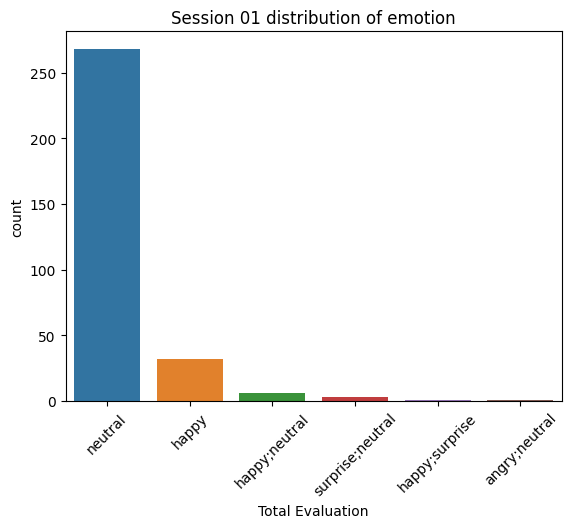

./data/KEMDy20_v1_1/annotation/Sess02_eval.csv


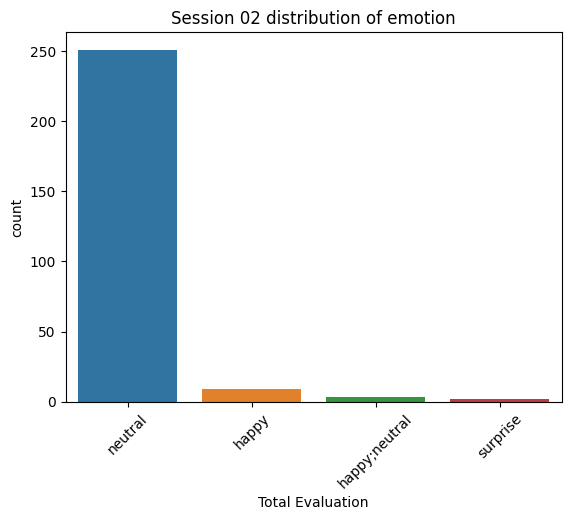

./data/KEMDy20_v1_1/annotation/Sess03_eval.csv


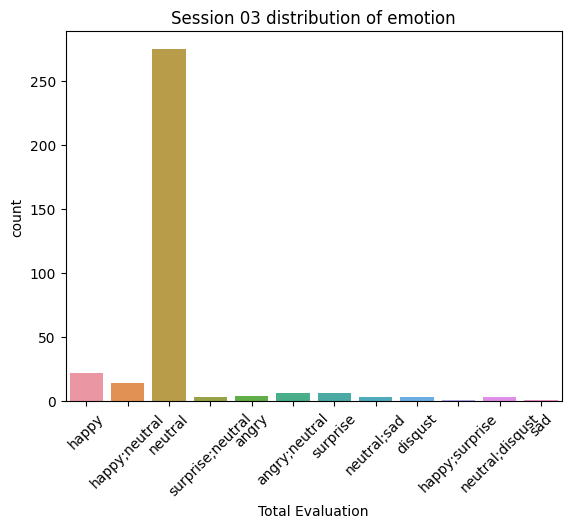

./data/KEMDy20_v1_1/annotation/Sess04_eval.csv


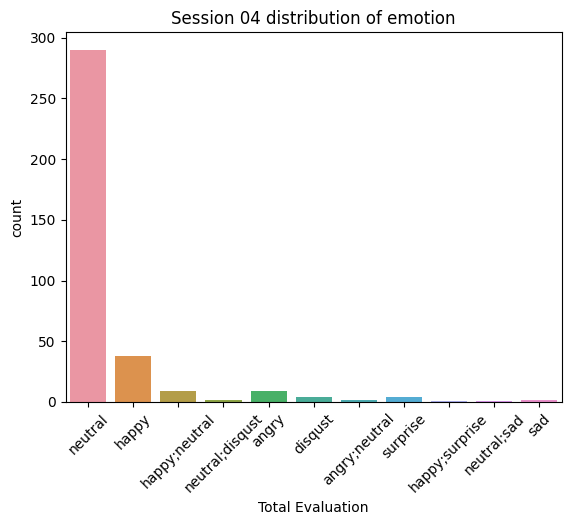

./data/KEMDy20_v1_1/annotation/Sess05_eval.csv


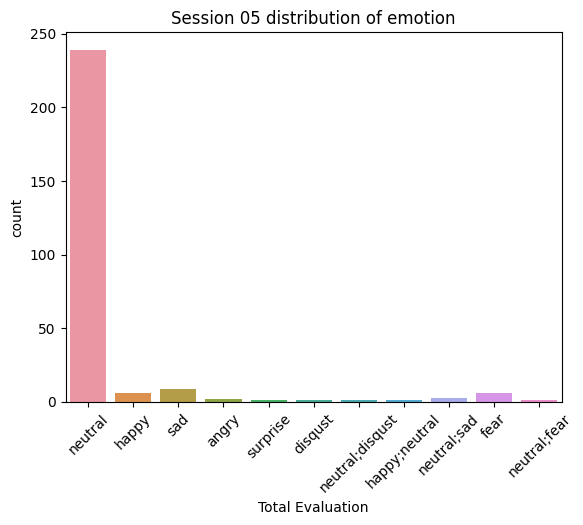

./data/KEMDy20_v1_1/annotation/Sess06_eval.csv


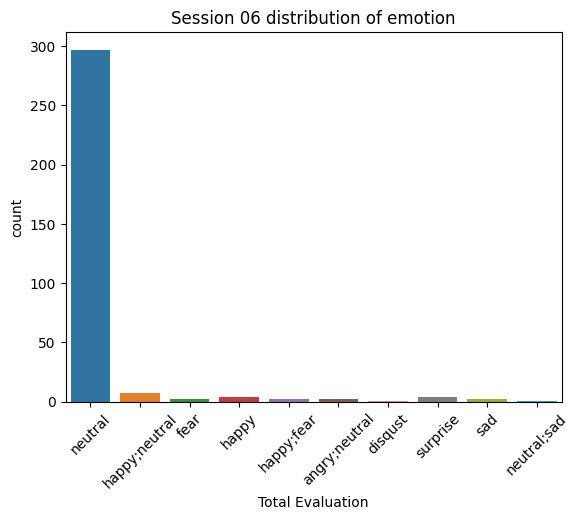

./data/KEMDy20_v1_1/annotation/Sess07_eval.csv


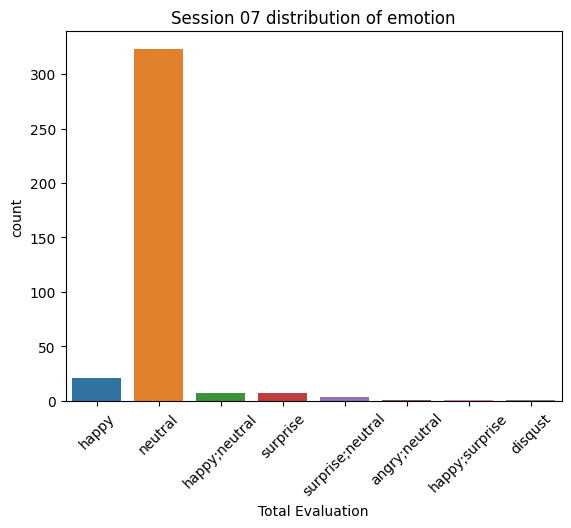

./data/KEMDy20_v1_1/annotation/Sess08_eval.csv


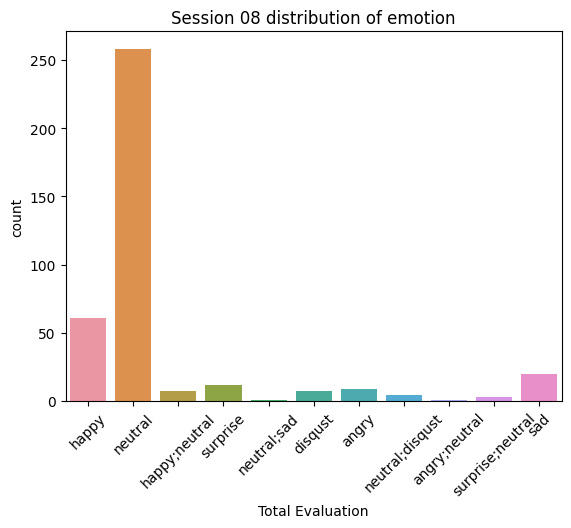

./data/KEMDy20_v1_1/annotation/Sess09_eval.csv


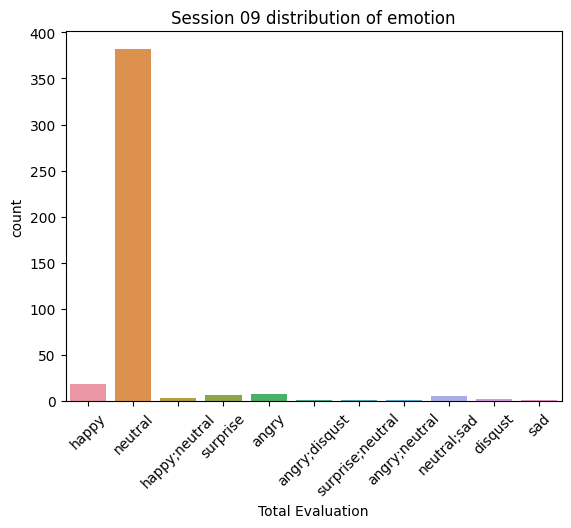

./data/KEMDy20_v1_1/annotation/Sess10_eval.csv


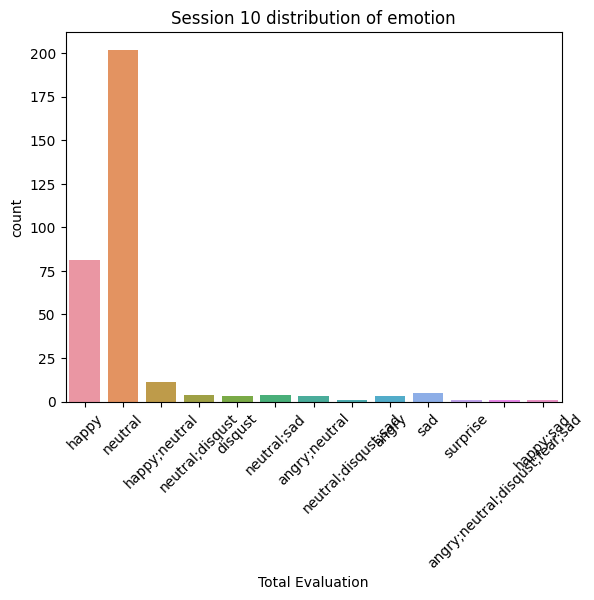

./data/KEMDy20_v1_1/annotation/Sess11_eval.csv


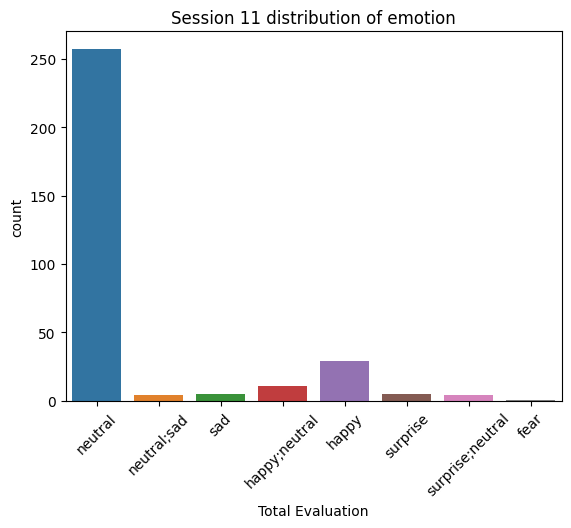

./data/KEMDy20_v1_1/annotation/Sess12_eval.csv


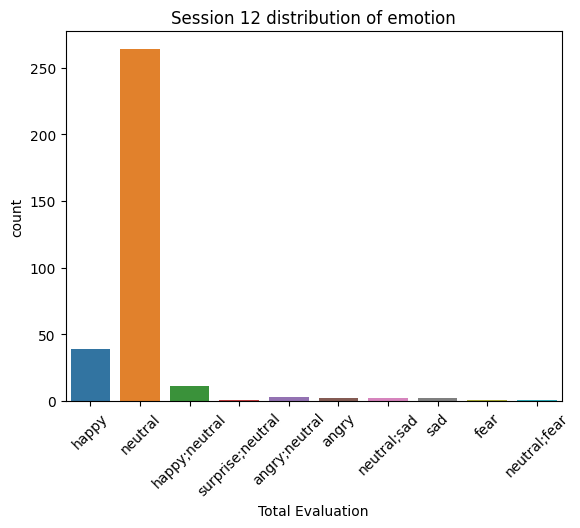

./data/KEMDy20_v1_1/annotation/Sess13_eval.csv


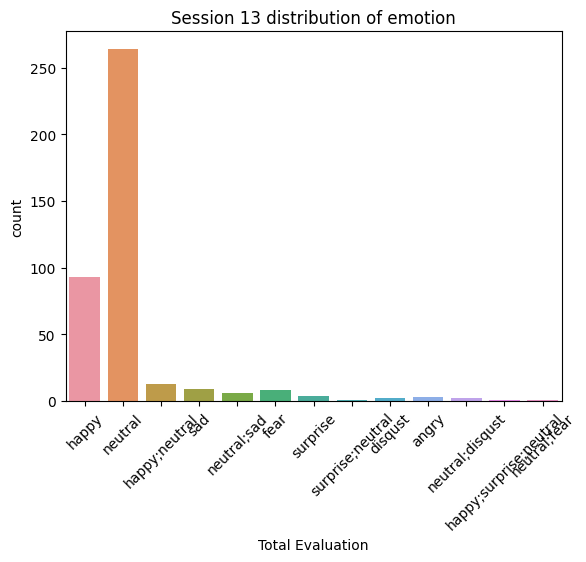

./data/KEMDy20_v1_1/annotation/Sess14_eval.csv


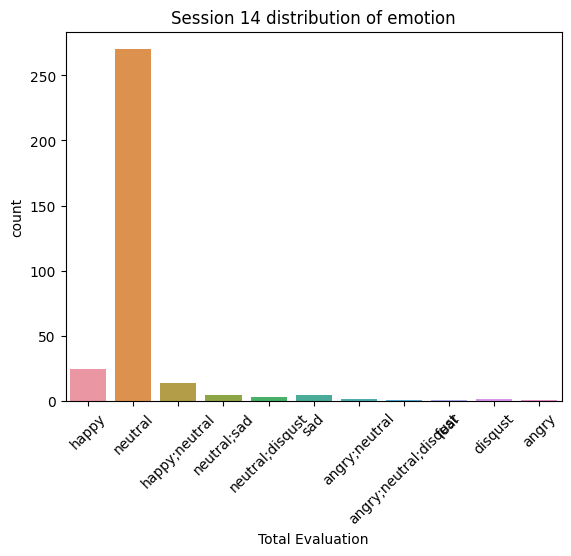

./data/KEMDy20_v1_1/annotation/Sess15_eval.csv


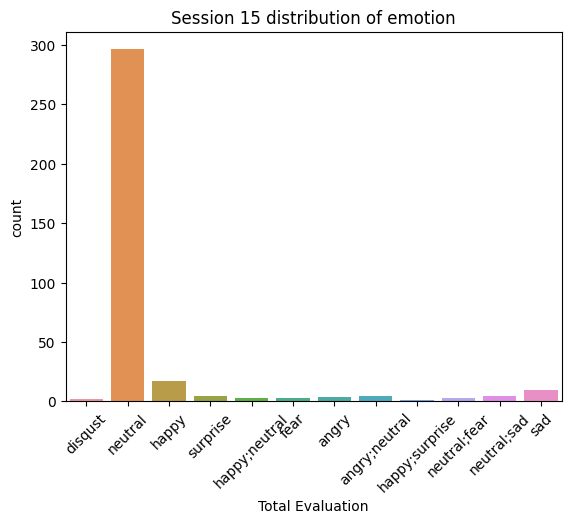

./data/KEMDy20_v1_1/annotation/Sess16_eval.csv


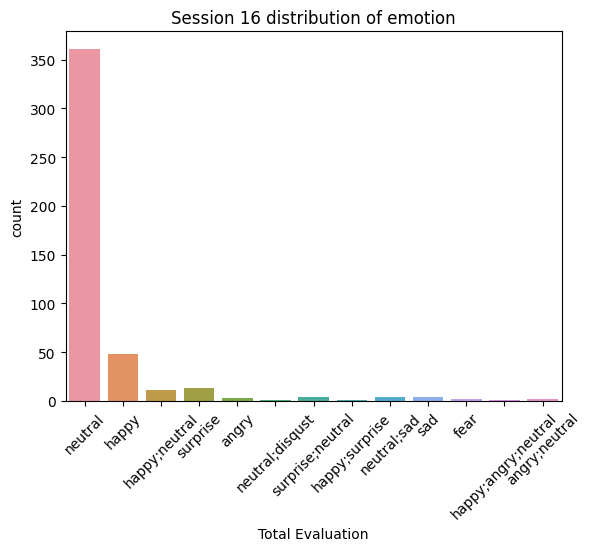

./data/KEMDy20_v1_1/annotation/Sess17_eval.csv


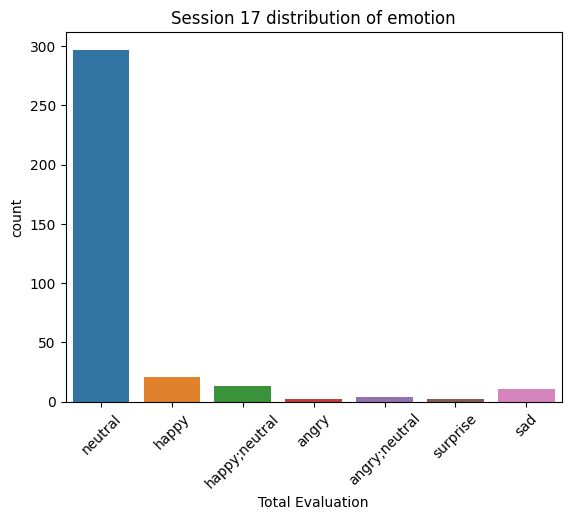

./data/KEMDy20_v1_1/annotation/Sess18_eval.csv


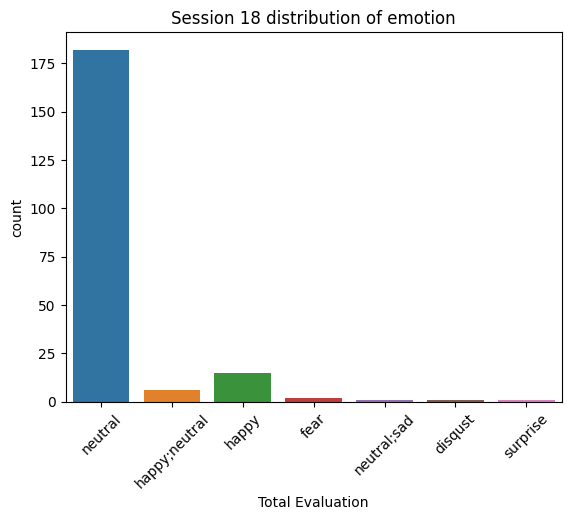

./data/KEMDy20_v1_1/annotation/Sess19_eval.csv


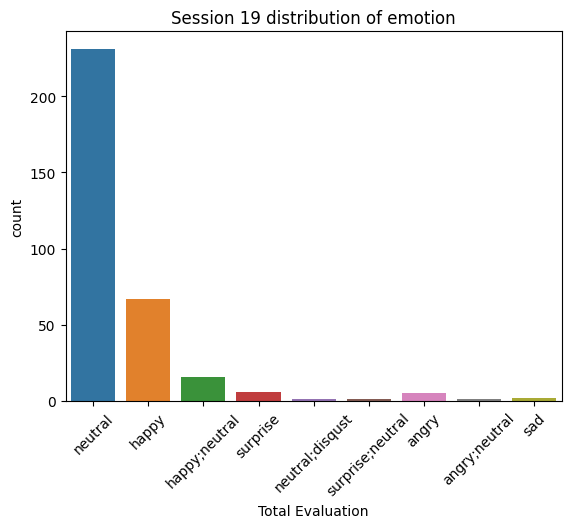

./data/KEMDy20_v1_1/annotation/Sess20_eval.csv


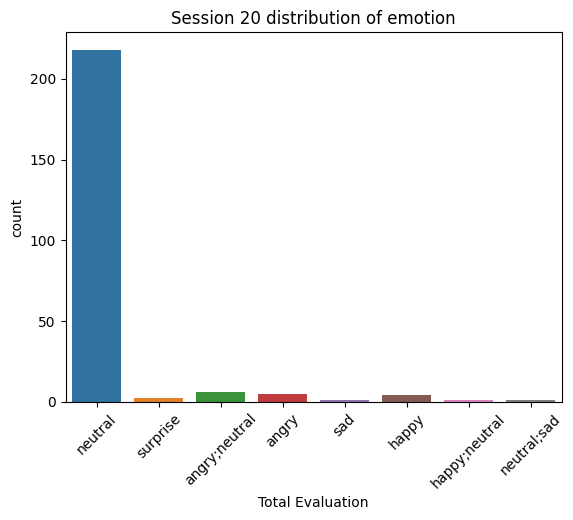

./data/KEMDy20_v1_1/annotation/Sess21_eval.csv


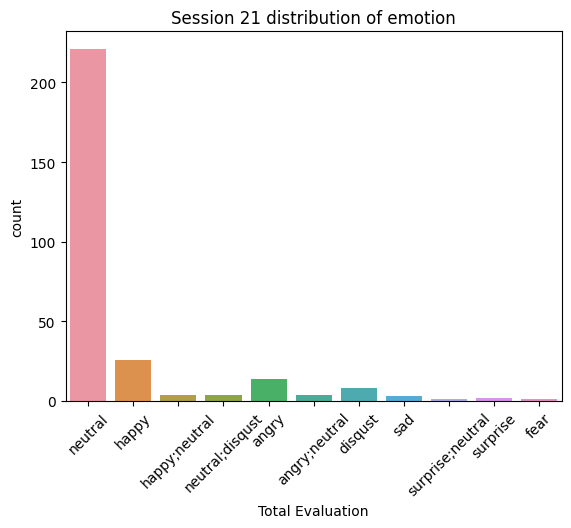

./data/KEMDy20_v1_1/annotation/Sess22_eval.csv


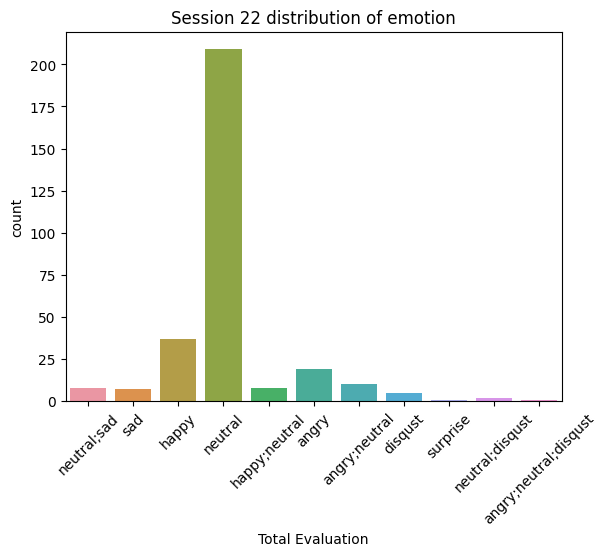

./data/KEMDy20_v1_1/annotation/Sess23_eval.csv


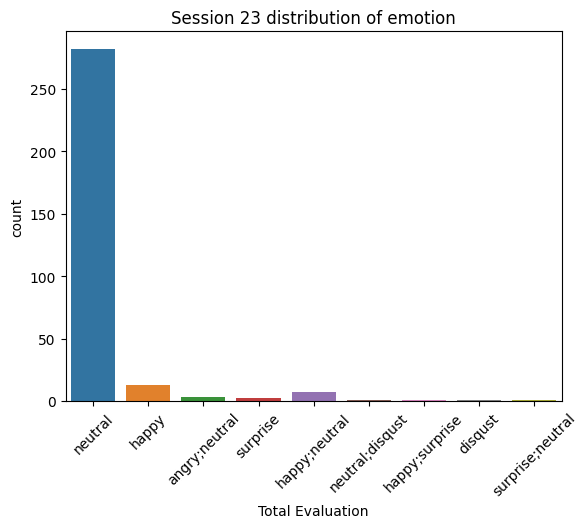

./data/KEMDy20_v1_1/annotation/Sess24_eval.csv


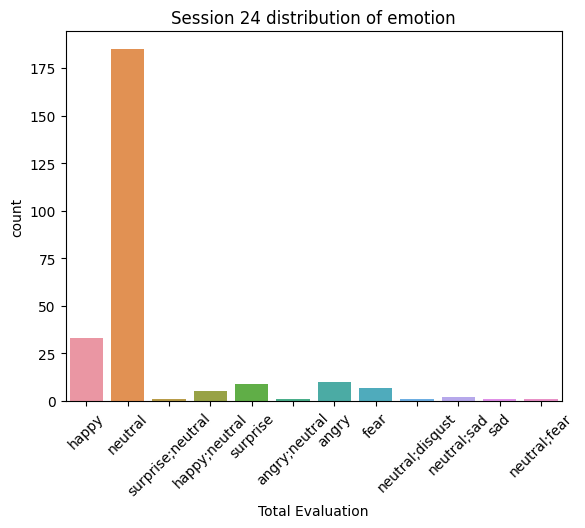

./data/KEMDy20_v1_1/annotation/Sess25_eval.csv


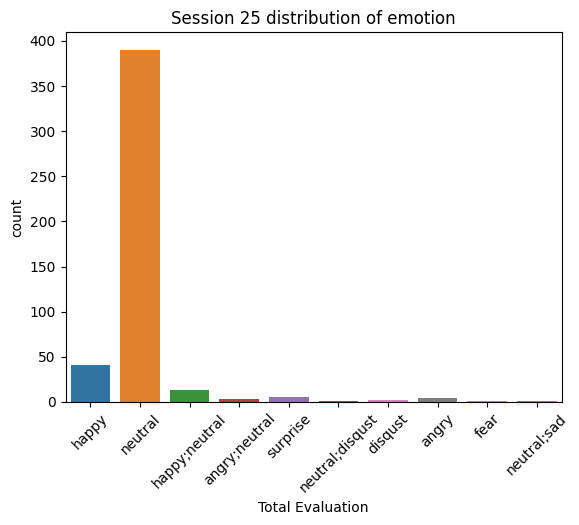

./data/KEMDy20_v1_1/annotation/Sess26_eval.csv


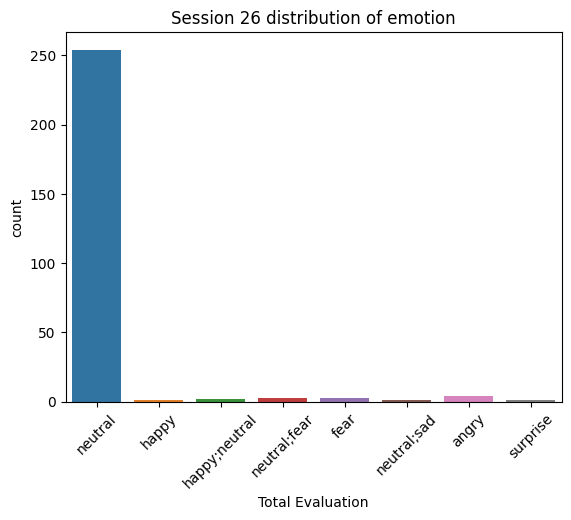

./data/KEMDy20_v1_1/annotation/Sess27_eval.csv


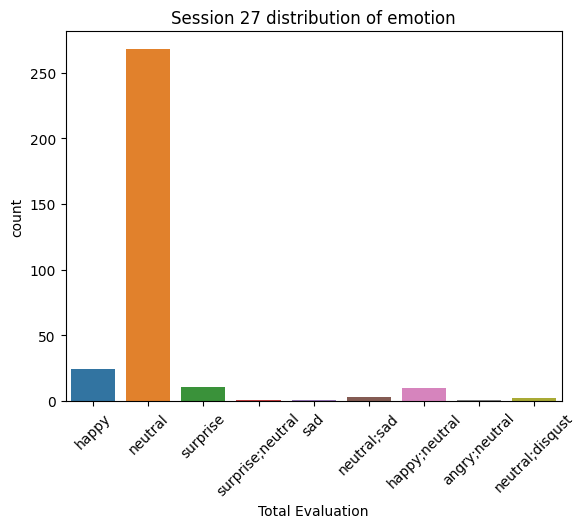

./data/KEMDy20_v1_1/annotation/Sess28_eval.csv


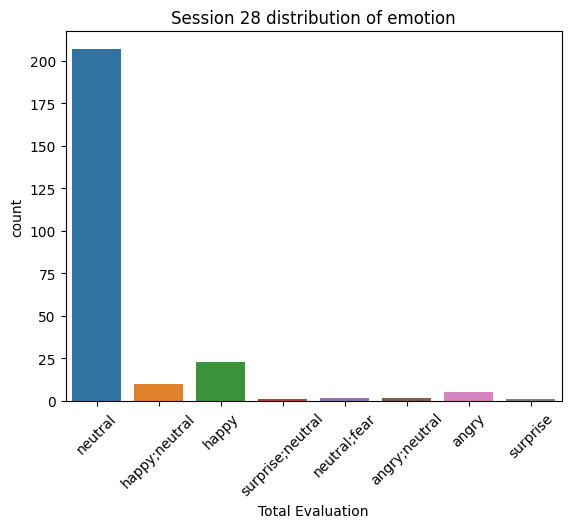

./data/KEMDy20_v1_1/annotation/Sess29_eval.csv


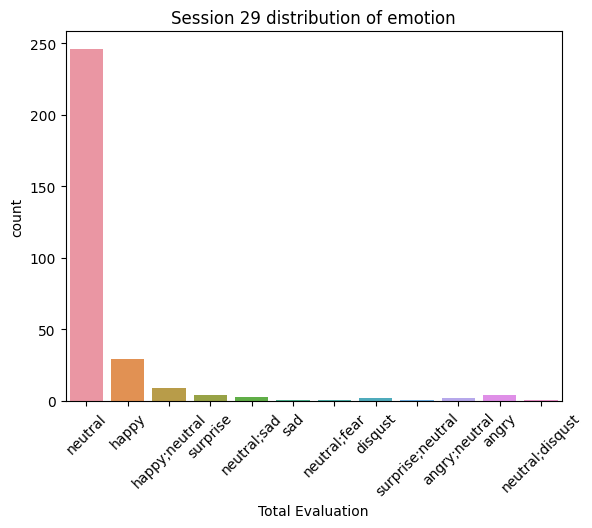

./data/KEMDy20_v1_1/annotation/Sess30_eval.csv


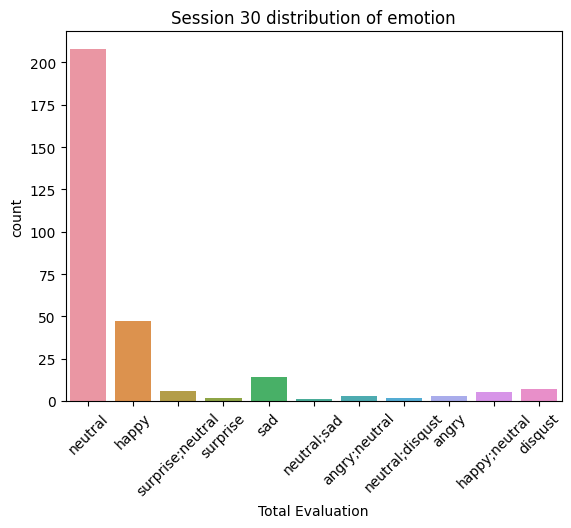

./data/KEMDy20_v1_1/annotation/Sess31_eval.csv


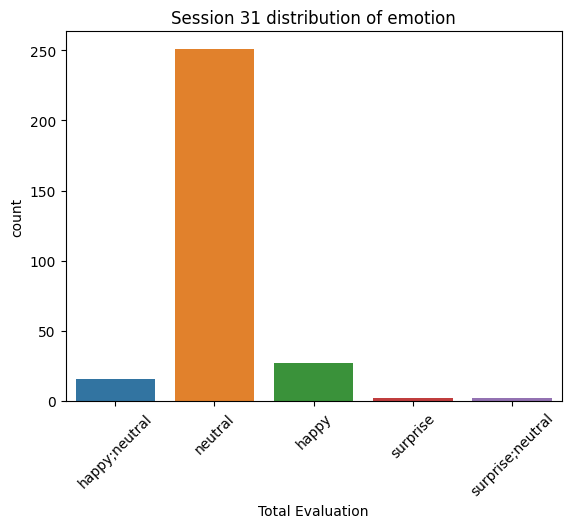

./data/KEMDy20_v1_1/annotation/Sess32_eval.csv


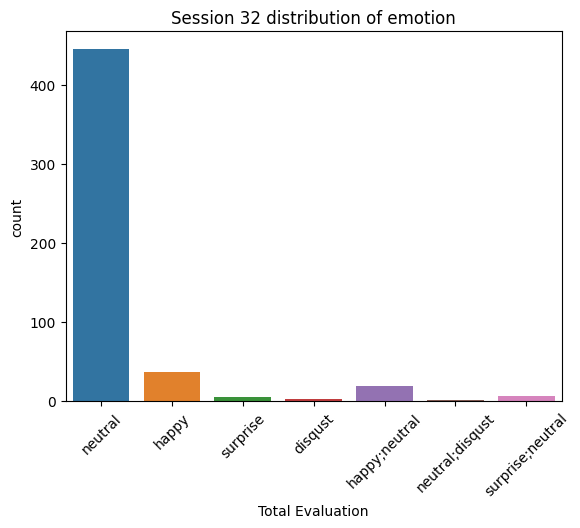

./data/KEMDy20_v1_1/annotation/Sess33_eval.csv


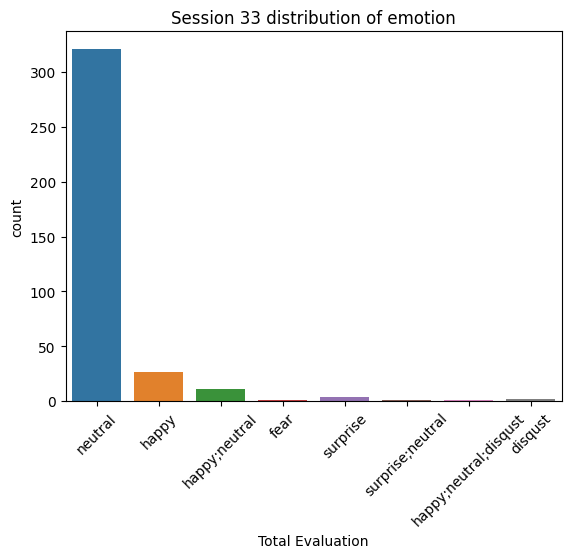

./data/KEMDy20_v1_1/annotation/Sess34_eval.csv


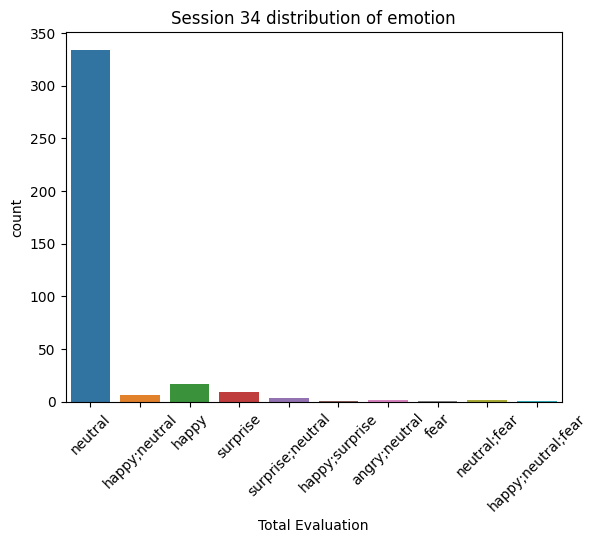

./data/KEMDy20_v1_1/annotation/Sess35_eval.csv


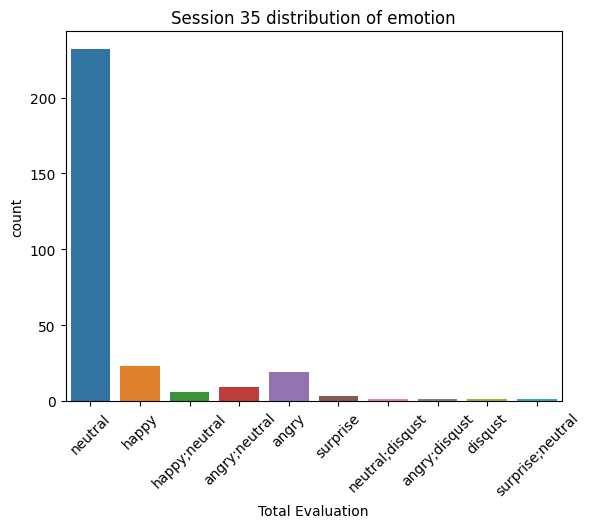

./data/KEMDy20_v1_1/annotation/Sess36_eval.csv


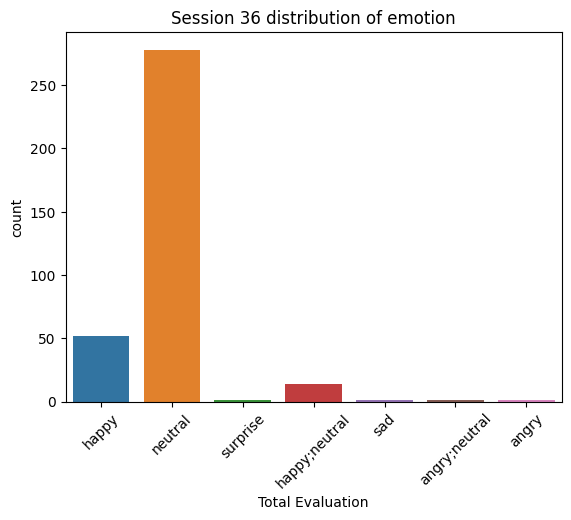

./data/KEMDy20_v1_1/annotation/Sess37_eval.csv


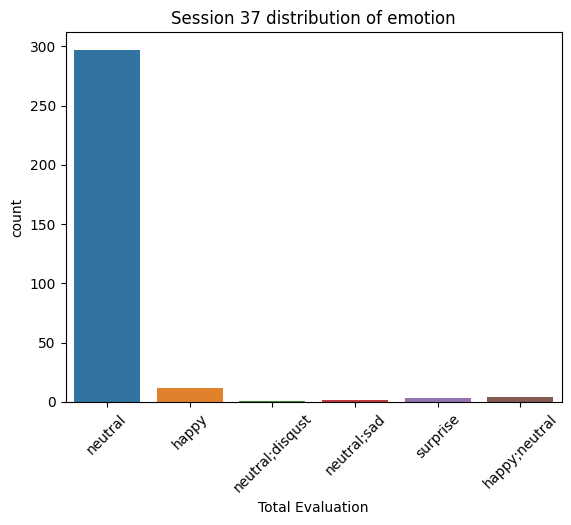

./data/KEMDy20_v1_1/annotation/Sess38_eval.csv


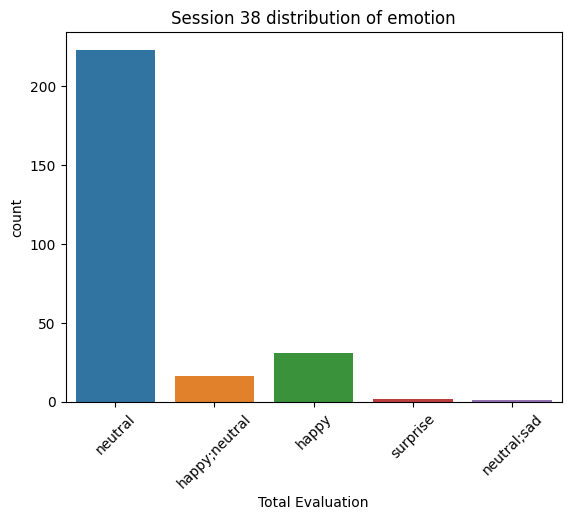

./data/KEMDy20_v1_1/annotation/Sess39_eval.csv


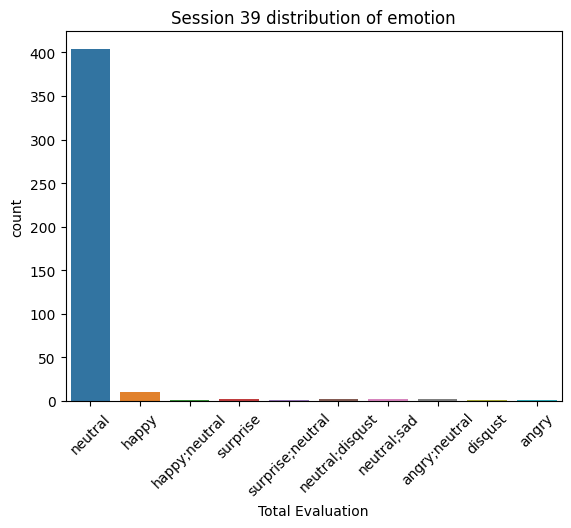

./data/KEMDy20_v1_1/annotation/Sess40_eval.csv


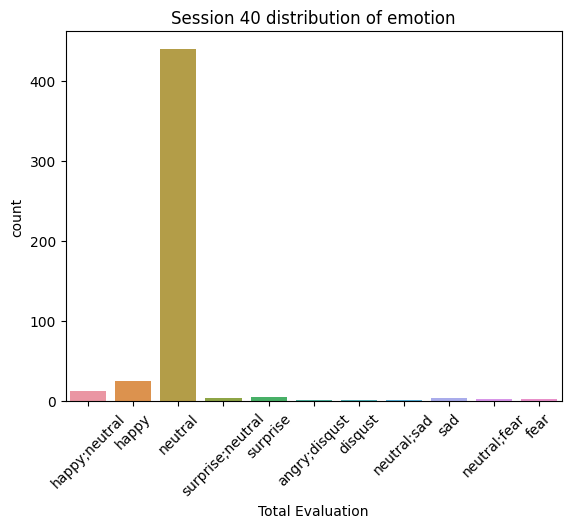

In [59]:
#annot_path = glob('./data/KEMDy20_v1_1/annotation/*')
session = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
          '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']

for i in session:
    folder = './data/KEMDy20_v1_1/annotation/' + f'Sess{i}_eval.csv'
    print(folder)
    df = pd.read_csv(folder)
    df.drop([0], axis=0, inplace=True)
    #print(f'Session {i} distribution of emotion :\n', df['Total Evaluation'].value_counts())
    sns.countplot(x=df['Total Evaluation'], data=df)
    plt.title(f'Session {i} distribution of emotion')
    plt.xticks(rotation=45)
    plt.show()

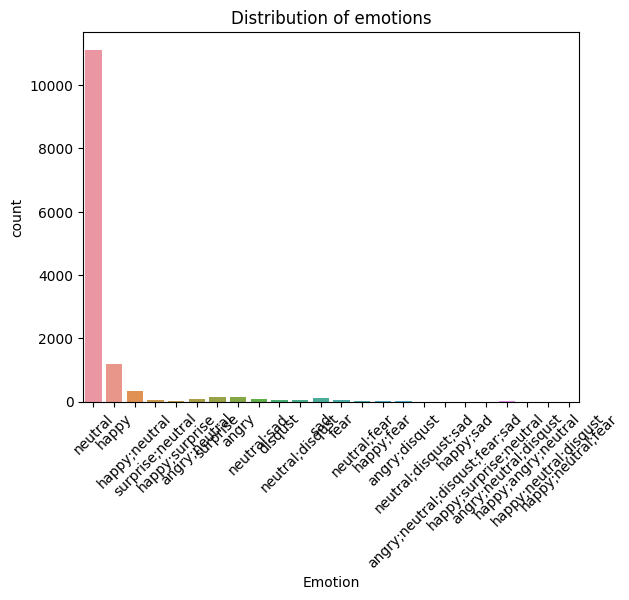

In [20]:
annot = pd.read_csv('./data/KEMDy20_v1_1/merged_annotations.csv')
sns.countplot(x=annot['Emotion'], data=annot)
plt.title('Distribution of emotions')
plt.xticks(rotation=45)
plt.show()

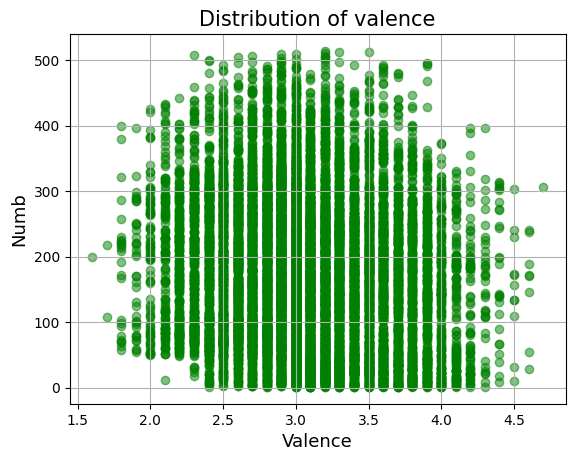

In [31]:
annot = pd.read_csv('./data/KEMDy20_v1_1/merged_annotations.csv')
plt.title('Distribution of valence', fontsize=15)
plt.scatter(annot['Valence'], annot["Numb"], color='green', alpha=.5)
plt.xlabel("Valence", fontsize=13)
plt.ylabel("Numb", fontsize=13)
plt.grid()
plt.show()

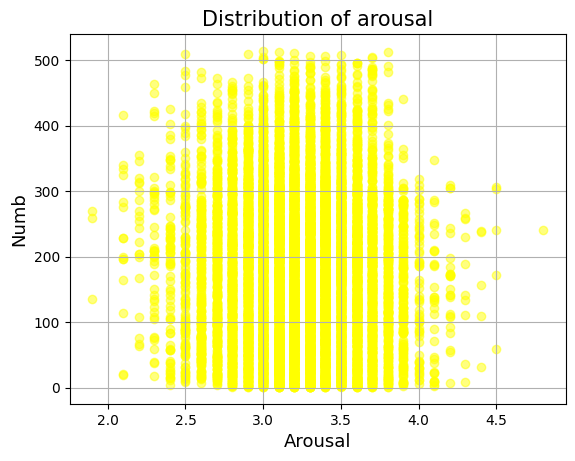

In [32]:
#annot = pd.read_csv('./data/KEMDy20_v1_1/merged_annotations.csv')
plt.title('Distribution of arousal', fontsize=15)
plt.scatter(annot['Arousal'], annot["Numb"], color='yellow', alpha=.5)
plt.xlabel("Arousal", fontsize=13)
plt.ylabel("Numb", fontsize=13)
plt.grid()
plt.show()

In [24]:
print("Total of classes: ", len(annot['Emotion'].value_counts()))
print(annot['Emotion'].value_counts())

Total of classes:  24
neutral                           11120
happy                              1183
happy;neutral                       345
surprise                            156
angry                               144
sad                                 121
angry;neutral                        83
neutral;sad                          71
disqust                              61
surprise;neutral                     56
fear                                 43
neutral;disqust                      40
neutral;fear                         17
happy;surprise                        8
angry;disqust                         3
happy;fear                            2
angry;neutral;disqust                 2
neutral;disqust;sad                   1
angry;neutral;disqust;fear;sad        1
happy;sad                             1
happy;surprise;neutral                1
happy;angry;neutral                   1
happy;neutral;disqust                 1
happy;neutral;fear                    1
Name: Emotion, dty

In [43]:
folder = './data/KEMDy20_v1_1/annotation/' + 'Sess01_eval.csv'
df = pd.read_csv(folder)
print(df.columns)

Index(['Numb', 'WAV', ' ', 'Segment ID', 'Total Evaluation', ' .1', ' .2',
       'Eval01F', ' .3', ' .4', 'Eval02M', ' .5', ' .6', 'Eval03M', ' .7',
       ' .8', 'Eval04F', ' .9', ' .10', 'Eval05M', ' .11', ' .12', 'Eval06F',
       ' .13', ' .14', 'Eval07F', ' .15', ' .16', 'Eval08M', ' .17', ' .18',
       'Eval09F', ' .19', ' .20', 'Eval10M', ' .21', ' .22'],
      dtype='object')


In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312 entries, 0 to 311
Data columns (total 37 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Numb              312 non-null    object
 1   WAV               312 non-null    object
 2                     312 non-null    object
 3   Segment ID        312 non-null    object
 4   Total Evaluation  312 non-null    object
 5    .1               312 non-null    object
 6    .2               312 non-null    object
 7   Eval01F           312 non-null    object
 8    .3               312 non-null    object
 9    .4               312 non-null    object
 10  Eval02M           312 non-null    object
 11   .5               312 non-null    object
 12   .6               312 non-null    object
 13  Eval03M           312 non-null    object
 14   .7               312 non-null    object
 15   .8               312 non-null    object
 16  Eval04F           312 non-null    object
 17   .9             

In [45]:
df.drop([0], axis=0, inplace=True)

In [46]:
print(df)

    Numb        WAV                               Segment ID Total Evaluation  \
1      1  3.5783901  11.637391  Sess01_script01_User002M_001          neutral   
2      2  11.637391  23.334393  Sess01_script01_User002M_002          neutral   
3      3  23.334393  31.558392  Sess01_script01_User002M_003          neutral   
4      4  31.558392   42.97039  Sess01_script01_User002M_004          neutral   
5      5   42.77729   44.86329  Sess01_script01_User001F_001          neutral   
..   ...        ...        ...                           ...              ...   
307  307  318.79968   331.0077  Sess01_script06_User001F_016          neutral   
308  308  328.94327  333.90628  Sess01_script06_User002M_041          neutral   
309  309  333.90628  336.59326  Sess01_script06_User002M_042          neutral   
310  310  336.59326  337.92126  Sess01_script06_User002M_043          neutral   
311  311   338.8657   347.5847  Sess01_script06_User001F_017          neutral   

      .1   .2  Eval01F  .3 

In [47]:
#df[' .1'] = df[' .1'].astype(float)
df[' .1'] = pd.to_numeric(df[' .1'])

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 311 entries, 1 to 311
Data columns (total 37 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Numb              311 non-null    object 
 1   WAV               311 non-null    object 
 2                     311 non-null    object 
 3   Segment ID        311 non-null    object 
 4   Total Evaluation  311 non-null    object 
 5    .1               311 non-null    float64
 6    .2               311 non-null    object 
 7   Eval01F           311 non-null    object 
 8    .3               311 non-null    object 
 9    .4               311 non-null    object 
 10  Eval02M           311 non-null    object 
 11   .5               311 non-null    object 
 12   .6               311 non-null    object 
 13  Eval03M           311 non-null    object 
 14   .7               311 non-null    object 
 15   .8               311 non-null    object 
 16  Eval04F           311 non-null    object 
 1

- 감정 레이블 평가 파일(KEMDy20/annotation)은 각 세그먼트의 외부 관찰자의 감정 레이블 평가결과를 포함한다.  발화 세그먼트 별 최종 카테고리 감정 레이블은 10명의 평가자에서 가장 많이 선택된 레이블로 결정(동일 평가 수를 갖는 경우에는 중복 레이블로 설정)되었고, 각성도와 긍/부정도는 각 평가자의 평균값으로 계산되었다. (https://nanum.etri.re.kr/share/kjnoh/KEMDy20?lang=ko_KR)
     - Arousal : (이완) 1-2-3-4-5 (각성)
     - Valence : (부정) 1-2-3-4-5 (긍정)

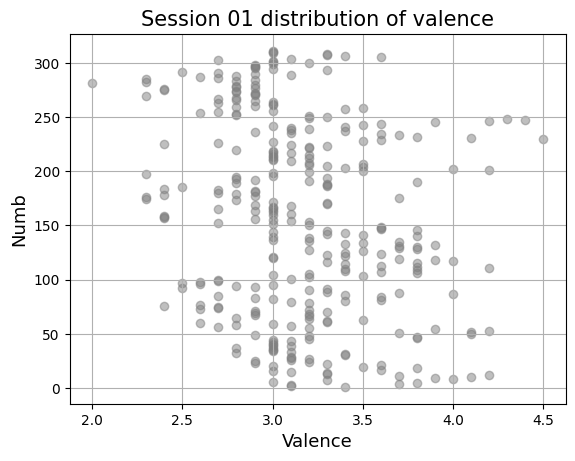

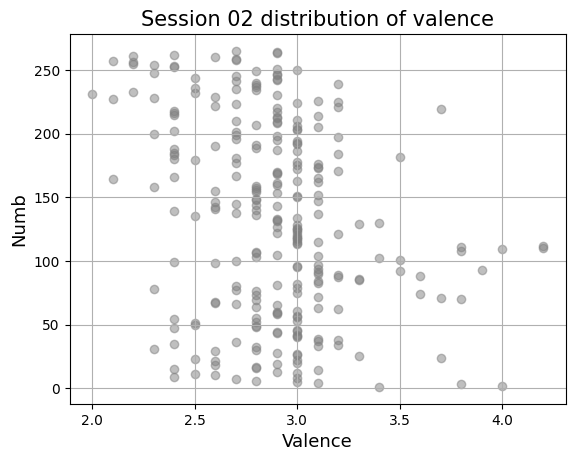

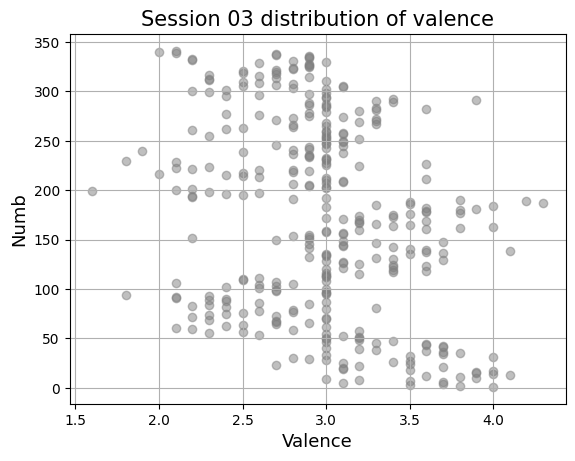

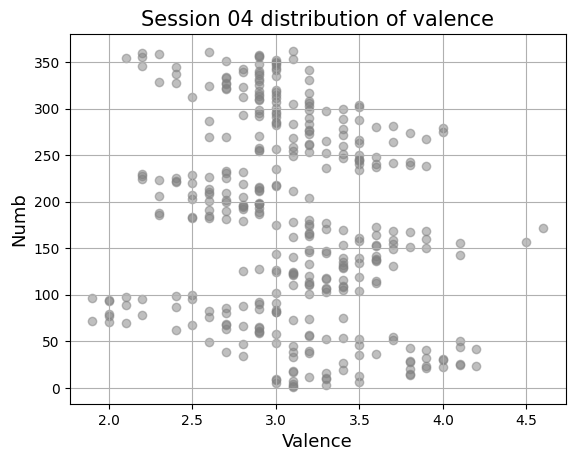

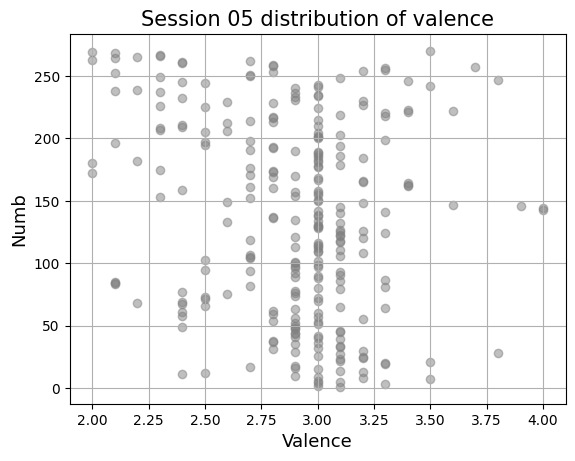

...

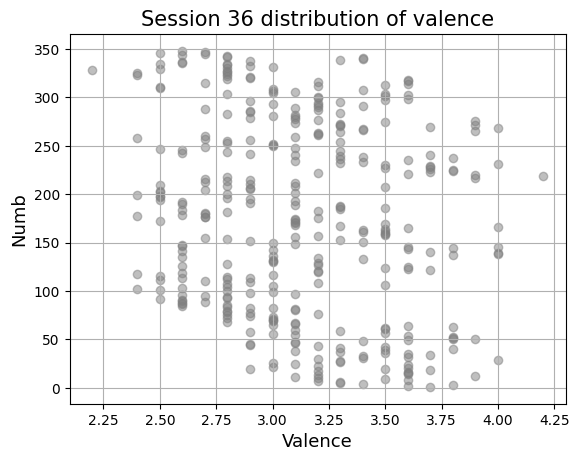

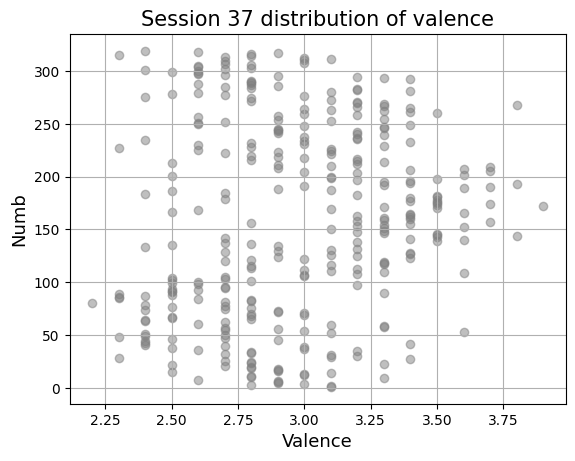

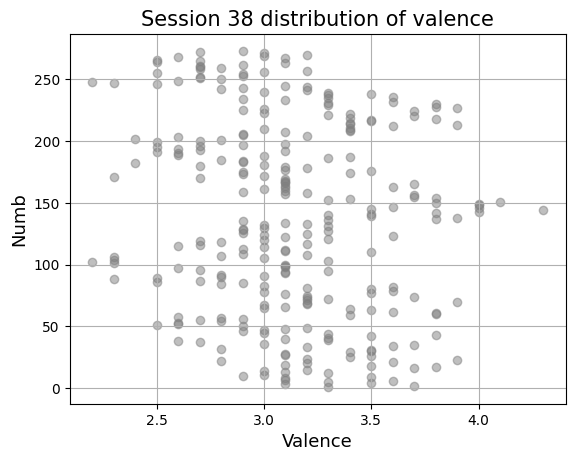

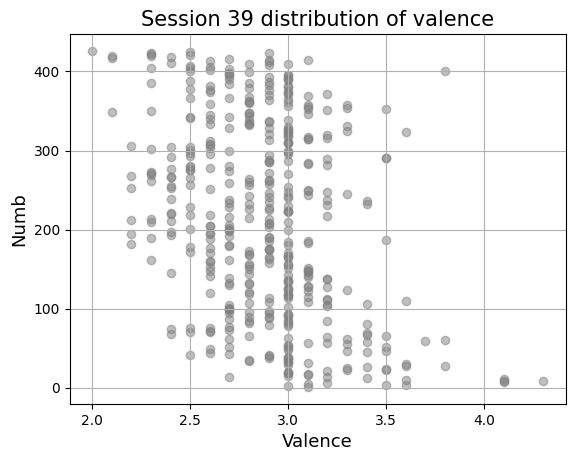

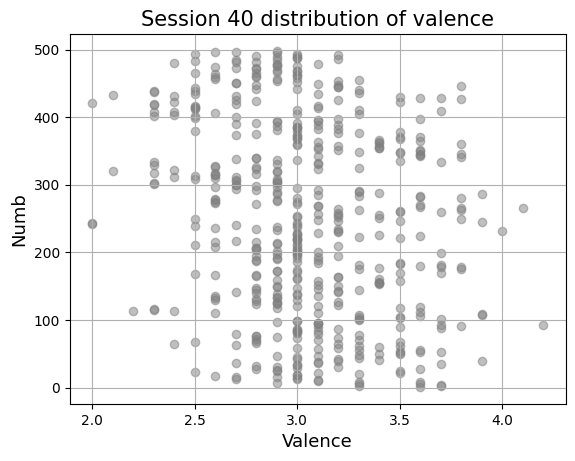

In [52]:
session = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
          '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']

for i in session:
    folder = './data/KEMDy20_v1_1/annotation/' + f'Sess{i}_eval.csv'
    #print(folder)
    df = pd.read_csv(folder)
    df.drop([0], axis=0, inplace=True)
    df[' .1'] = pd.to_numeric(df[' .1'])
    df['Numb'] = pd.to_numeric(df['Numb'])
    plt.title(f'Session {i} distribution of valence', fontsize=15)
    plt.scatter(df[" .1"], df["Numb"], color='grey', alpha=.5)
    plt.xlabel("Valence", fontsize=13)
    plt.ylabel("Numb", fontsize=13)
    plt.grid()
    plt.show()

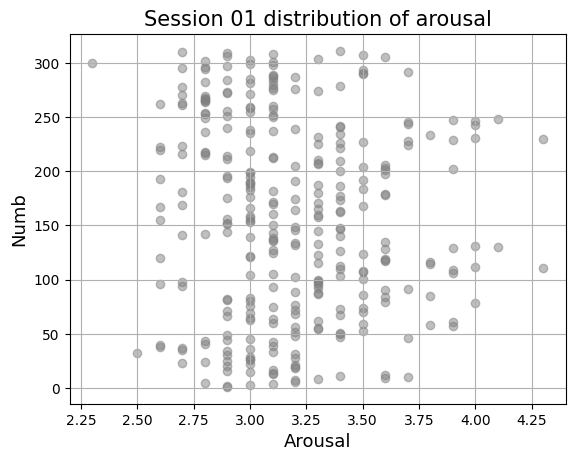

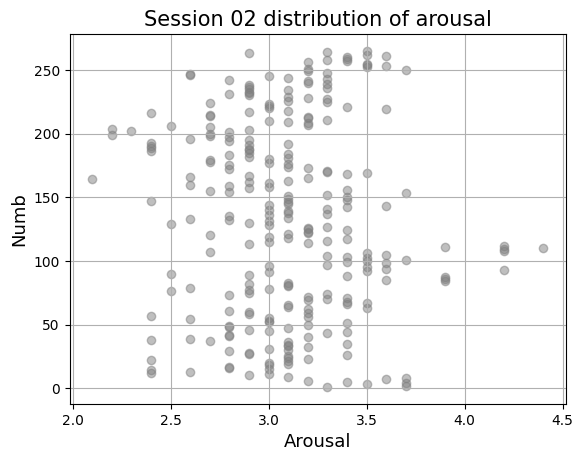

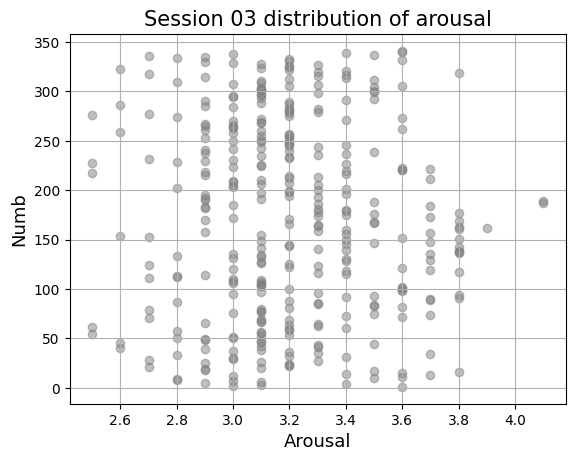

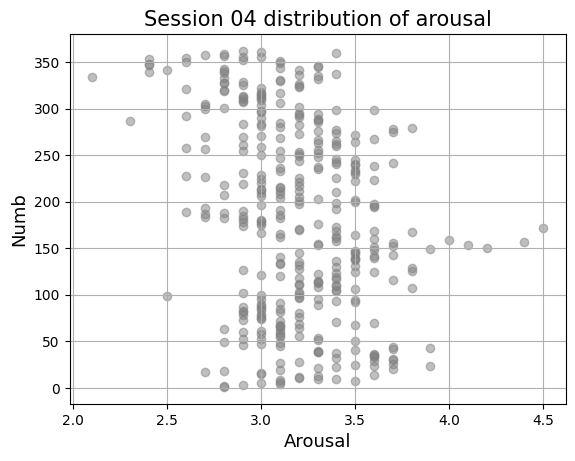

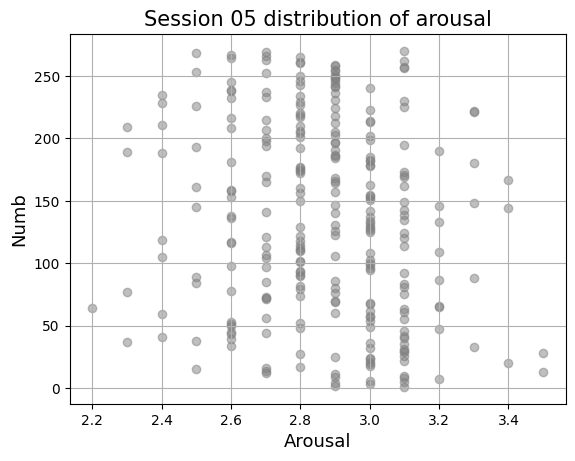

...

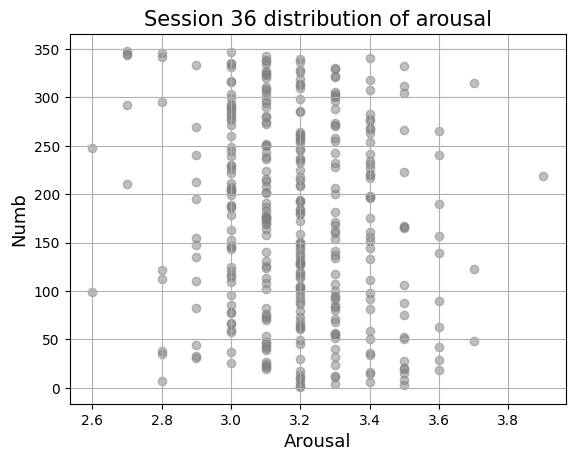

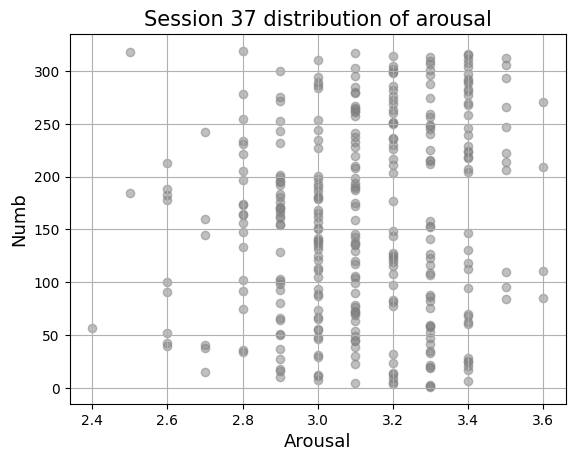

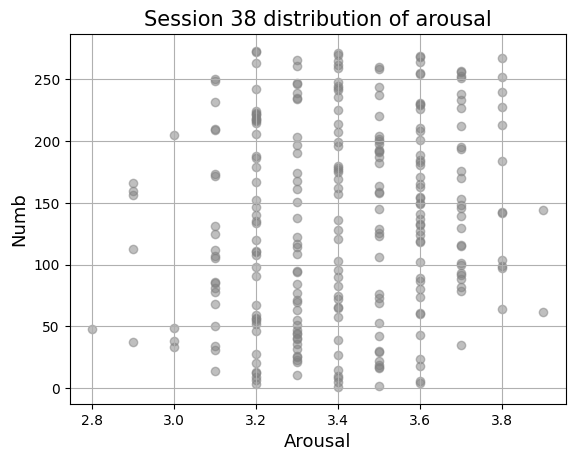

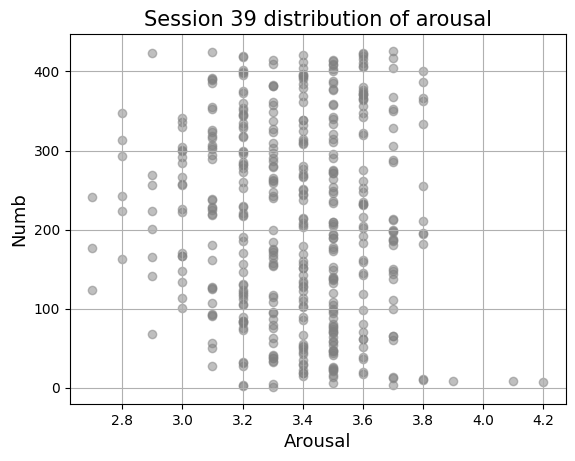

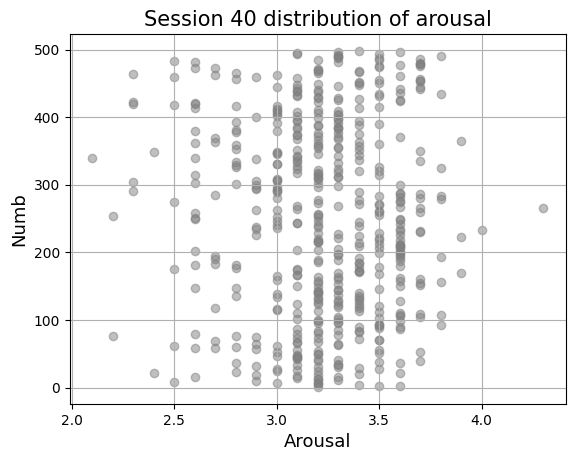

In [62]:
session = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
          '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']

for i in session:
    folder = './data/KEMDy20_v1_1/annotation/' + f'Sess{i}_eval.csv'
    #print(folder)
    df = pd.read_csv(folder)
    df.drop([0], axis=0, inplace=True)
    df[' .2'] = pd.to_numeric(df[' .2'])
    df['Numb'] = pd.to_numeric(df['Numb'])
    plt.title(f'Session {i} distribution of arousal', fontsize=15)
    plt.scatter(df[" .2"], df["Numb"], color='grey', alpha=.5)
    plt.xlabel("Arousal", fontsize=13)
    plt.ylabel("Numb", fontsize=13)
    plt.grid()
    plt.show()

In [55]:
session = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
          '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']

for i in session:
    folder = './data/KEMDy20_v1_1/annotation/' + f'Sess{i}_eval.csv'
    #print(folder)
    df = pd.read_csv(folder)
    df.drop([0], axis=0, inplace=True)
    df[' .1'] = pd.to_numeric(df[' .1'])
    df[' .2'] = pd.to_numeric(df[' .2'])
    print(df[[' .1', ' .2']].describe())

               .1          .2
count  311.000000  311.000000
mean     3.162379    3.185531
std      0.432882    0.352708
min      2.000000    2.300000
25%      2.900000    2.900000
50%      3.100000    3.100000
75%      3.400000    3.400000
max      4.500000    4.300000
               .1          .2
count  265.000000  265.000000
mean     2.886038    3.091321
std      0.358545    0.373000
min      2.000000    2.100000
25%      2.700000    2.900000
50%      2.900000    3.100000
75%      3.000000    3.300000
max      4.200000    4.400000
               .1          .2
count  341.000000  341.000000
mean     2.977713    3.202346
std      0.485225    0.304177
min      1.600000    2.500000
25%      2.700000    3.000000
50%      3.000000    3.200000
75%      3.300000    3.400000
max      4.300000    4.100000
               .1          .2
count  362.000000  362.000000
mean     3.091160    3.189503
std      0.482065    0.329442
min      1.900000    2.100000
25%      2.800000    3.000000
50%      3

### 데이터 분석

### 음성데이터 길이 분석

In [63]:
def Audio_length(file_path):
    y, sr = librosa.load(file_path)
    audio_length = round((len(y)/sr), 2)
    print(audio_length)

In [64]:
pwd

'C:\\Users\\enech\\OneDrive\\바탕 화면\\Master_Univ\\Project\\AI음성분류\\ETRI_competition'

In [101]:
session = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
          '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40']

for i in session:
    folder = glob(f'./data/KEMDy20_v1_1/wav/Session{i}/*.wav')
    #print(folder)
    audio_length_list = []

    for file in tqdm(folder, colour='green'):
        if 'wav' in file:
            #abs_file_path = os.path.join(folder, file)
            y, sr = librosa.load(file)
            audio_length = round((len(y)/sr), 2)
            audio_length_list.append(audio_length)
            
    print(f' Session {i} is done !!!!')
    globals()['data_'+f'{i}'] = pd.DataFrame(audio_length_list, columns=['audio_length'])
    print(f'Sessing {i} Audio length static: ', globals()['data_'+f'{i}'].describe())
    

100%|███████████████████████████████████████████████████████████████████████████████| 311/311 [00:00<00:00, 478.77it/s]


 Session 01 is done !!!!
Sessing 01 Audio length static:         audio_length
count    311.000000
mean       6.330193
std        4.189780
min        0.730000
25%        2.955000
50%        5.480000
75%        8.220000
max       22.010000


100%|███████████████████████████████████████████████████████████████████████████████| 265/265 [00:00<00:00, 472.24it/s]


 Session 02 is done !!!!
Sessing 02 Audio length static:         audio_length
count    265.000000
mean       7.032038
std        5.436543
min        0.950000
25%        2.890000
50%        5.150000
75%        9.960000
max       24.560000


100%|███████████████████████████████████████████████████████████████████████████████| 341/341 [00:00<00:00, 565.89it/s]


 Session 03 is done !!!!
Sessing 03 Audio length static:         audio_length
count    341.000000
mean       5.451496
std        3.791321
min        0.900000
25%        2.560000
50%        4.190000
75%        7.440000
max       22.810000


100%|███████████████████████████████████████████████████████████████████████████████| 362/362 [00:00<00:00, 566.35it/s]


 Session 04 is done !!!!
Sessing 04 Audio length static:         audio_length
count     362.00000
mean        5.45511
std         4.63528
min         0.78000
25%         2.27250
50%         3.78500
75%         7.07000
max        26.25000


100%|███████████████████████████████████████████████████████████████████████████████| 270/270 [00:00<00:00, 523.36it/s]


 Session 05 is done !!!!
Sessing 05 Audio length static:         audio_length
count    270.000000
mean       6.337444
std        5.069543
min        0.970000
25%        2.592500
50%        4.785000
75%        8.495000
max       23.000000


100%|███████████████████████████████████████████████████████████████████████████████| 322/322 [00:00<00:00, 535.23it/s]


 Session 06 is done !!!!
Sessing 06 Audio length static:         audio_length
count    322.000000
mean       6.123882
std        4.750195
min        0.720000
25%        2.702500
50%        4.410000
75%        8.340000
max       23.980000


100%|███████████████████████████████████████████████████████████████████████████████| 365/365 [00:00<00:00, 604.24it/s]


 Session 07 is done !!!!
Sessing 07 Audio length static:         audio_length
count    365.000000
mean       5.133123
std        4.350597
min        0.770000
25%        2.160000
50%        3.650000
75%        6.440000
max       25.760000


100%|███████████████████████████████████████████████████████████████████████████████| 383/383 [00:00<00:00, 618.94it/s]


 Session 08 is done !!!!
Sessing 08 Audio length static:         audio_length
count    383.000000
mean       5.053342
std        3.851770
min        0.900000
25%        2.430000
50%        3.890000
75%        6.455000
max       24.410000


100%|███████████████████████████████████████████████████████████████████████████████| 428/428 [00:00<00:00, 688.57it/s]


 Session 09 is done !!!!
Sessing 09 Audio length static:         audio_length
count    428.000000
mean       4.511238
std        3.464516
min        0.700000
25%        2.177500
50%        3.430000
75%        5.692500
max       20.430000


100%|███████████████████████████████████████████████████████████████████████████████| 320/320 [00:00<00:00, 575.42it/s]


 Session 10 is done !!!!
Sessing 10 Audio length static:         audio_length
count    320.000000
mean       5.497281
std        3.906467
min        1.030000
25%        2.880000
50%        4.305000
75%        6.850000
max       22.690000


100%|███████████████████████████████████████████████████████████████████████████████| 316/316 [00:00<00:00, 569.30it/s]


 Session 11 is done !!!!
Sessing 11 Audio length static:         audio_length
count    316.000000
mean       5.730823
std        4.198324
min        0.770000
25%        2.640000
50%        4.535000
75%        7.530000
max       25.960000


100%|███████████████████████████████████████████████████████████████████████████████| 326/326 [00:00<00:00, 550.57it/s]


 Session 12 is done !!!!
Sessing 12 Audio length static:         audio_length
count    326.000000
mean       6.102914
std        4.389373
min        0.850000
25%        2.910000
50%        4.825000
75%        7.912500
max       25.640000


100%|███████████████████████████████████████████████████████████████████████████████| 407/407 [00:00<00:00, 654.19it/s]


 Session 13 is done !!!!
Sessing 13 Audio length static:         audio_length
count    407.000000
mean       4.820541
std        3.565542
min        0.930000
25%        2.385000
50%        3.800000
75%        6.115000
max       21.040000


100%|███████████████████████████████████████████████████████████████████████████████| 329/329 [00:00<00:00, 618.20it/s]


 Session 14 is done !!!!
Sessing 14 Audio length static:         audio_length
count    329.000000
mean       5.071884
std        4.068643
min        0.940000
25%        2.220000
50%        3.840000
75%        6.430000
max       23.620000


100%|███████████████████████████████████████████████████████████████████████████████| 354/354 [00:00<00:00, 590.23it/s]


 Session 15 is done !!!!
Sessing 15 Audio length static:         audio_length
count    354.000000
mean       5.317853
std        3.483781
min        0.770000
25%        2.727500
50%        4.275000
75%        7.145000
max       18.580000


100%|███████████████████████████████████████████████████████████████████████████████| 455/455 [00:00<00:00, 659.68it/s]


 Session 16 is done !!!!
Sessing 16 Audio length static:         audio_length
count    455.000000
mean       4.575055
std        3.285415
min        0.720000
25%        2.255000
50%        3.440000
75%        5.840000
max       22.150000


100%|███████████████████████████████████████████████████████████████████████████████| 350/350 [00:00<00:00, 552.87it/s]


 Session 17 is done !!!!
Sessing 17 Audio length static:         audio_length
count    350.000000
mean       5.736429
std        4.025550
min        0.790000
25%        2.805000
50%        4.635000
75%        7.450000
max       23.430000


100%|███████████████████████████████████████████████████████████████████████████████| 208/208 [00:00<00:00, 410.95it/s]


 Session 18 is done !!!!
Sessing 18 Audio length static:         audio_length
count    208.000000
mean       9.261971
std        6.190067
min        1.030000
25%        3.822500
50%        8.130000
75%       13.972500
max       23.720000


100%|███████████████████████████████████████████████████████████████████████████████| 330/330 [00:00<00:00, 493.04it/s]


 Session 19 is done !!!!
Sessing 19 Audio length static:         audio_length
count    330.000000
mean       6.659818
std        4.671296
min        1.040000
25%        3.157500
50%        5.160000
75%        9.345000
max       22.290000


100%|███████████████████████████████████████████████████████████████████████████████| 238/238 [00:00<00:00, 467.95it/s]


 Session 20 is done !!!!
Sessing 20 Audio length static:         audio_length
count    238.000000
mean       7.692857
std        5.207306
min        1.060000
25%        3.637500
50%        6.385000
75%       10.485000
max       21.990000


100%|███████████████████████████████████████████████████████████████████████████████| 288/288 [00:00<00:00, 494.91it/s]


 Session 21 is done !!!!
Sessing 21 Audio length static:         audio_length
count    288.000000
mean       6.777118
std        4.856164
min        0.930000
25%        3.340000
50%        5.655000
75%        8.557500
max       29.740000


100%|███████████████████████████████████████████████████████████████████████████████| 307/307 [00:00<00:00, 492.75it/s]


 Session 22 is done !!!!
Sessing 22 Audio length static:         audio_length
count    307.000000
mean       7.047524
std        4.485108
min        1.070000
25%        3.840000
50%        5.920000
75%        9.080000
max       27.790000


100%|███████████████████████████████████████████████████████████████████████████████| 311/311 [00:00<00:00, 503.63it/s]


 Session 23 is done !!!!
Sessing 23 Audio length static:         audio_length
count    311.000000
mean       6.827428
std        4.041558
min        1.350000
25%        3.710000
50%        5.870000
75%        8.805000
max       20.010000


100%|███████████████████████████████████████████████████████████████████████████████| 256/256 [00:00<00:00, 426.62it/s]


 Session 24 is done !!!!
Sessing 24 Audio length static:         audio_length
count    256.000000
mean       8.585703
std        5.587535
min        1.300000
25%        3.772500
50%        6.580000
75%       12.580000
max       24.990000


100%|███████████████████████████████████████████████████████████████████████████████| 462/462 [00:00<00:00, 635.74it/s]


 Session 25 is done !!!!
Sessing 25 Audio length static:         audio_length
count    462.000000
mean       4.784372
std        3.032094
min        0.850000
25%        2.660000
50%        3.780000
75%        5.765000
max       18.040000


100%|███████████████████████████████████████████████████████████████████████████████| 269/269 [00:00<00:00, 516.32it/s]


 Session 26 is done !!!!
Sessing 26 Audio length static:         audio_length
count    269.000000
mean       6.815911
std        3.803887
min        1.710000
25%        3.740000
50%        6.150000
75%        9.130000
max       23.250000


100%|███████████████████████████████████████████████████████████████████████████████| 321/321 [00:00<00:00, 514.74it/s]


 Session 27 is done !!!!
Sessing 27 Audio length static:         audio_length
count    321.000000
mean       6.508411
std        4.415899
min        1.270000
25%        2.920000
50%        5.160000
75%        9.350000
max       23.490000


100%|███████████████████████████████████████████████████████████████████████████████| 251/251 [00:00<00:00, 486.31it/s]


 Session 28 is done !!!!
Sessing 28 Audio length static:         audio_length
count    251.000000
mean       7.192271
std        4.029972
min        1.080000
25%        3.950000
50%        6.230000
75%        9.745000
max       20.720000


100%|███████████████████████████████████████████████████████████████████████████████| 303/303 [00:00<00:00, 521.88it/s]


 Session 29 is done !!!!
Sessing 29 Audio length static:         audio_length
count    303.000000
mean       6.487954
std        4.576360
min        1.170000
25%        3.285000
50%        5.010000
75%        8.180000
max       25.710000


100%|███████████████████████████████████████████████████████████████████████████████| 298/298 [00:00<00:00, 481.51it/s]


 Session 30 is done !!!!
Sessing 30 Audio length static:         audio_length
count    298.000000
mean       7.236208
std        4.526036
min        1.490000
25%        3.595000
50%        6.205000
75%        9.860000
max       22.370000


100%|███████████████████████████████████████████████████████████████████████████████| 298/298 [00:00<00:00, 513.79it/s]


 Session 31 is done !!!!
Sessing 31 Audio length static:         audio_length
count    298.000000
mean       6.585302
std        5.038445
min        0.760000
25%        2.920000
50%        4.985000
75%        8.285000
max       25.430000


100%|███████████████████████████████████████████████████████████████████████████████| 514/514 [00:00<00:00, 672.12it/s]


 Session 32 is done !!!!
Sessing 32 Audio length static:         audio_length
count    514.000000
mean       4.387276
std        3.339944
min        0.900000
25%        2.300000
50%        3.335000
75%        4.935000
max       25.250000


100%|███████████████████████████████████████████████████████████████████████████████| 367/367 [00:00<00:00, 605.50it/s]


 Session 33 is done !!!!
Sessing 33 Audio length static:         audio_length
count    367.000000
mean       5.375749
std        3.591769
min        0.800000
25%        2.570000
50%        4.250000
75%        7.375000
max       20.940000


100%|███████████████████████████████████████████████████████████████████████████████| 377/377 [00:00<00:00, 587.16it/s]


 Session 34 is done !!!!
Sessing 34 Audio length static:         audio_length
count    377.000000
mean       5.438621
std        3.868853
min        1.260000
25%        2.740000
50%        4.000000
75%        7.070000
max       25.320000


100%|███████████████████████████████████████████████████████████████████████████████| 296/296 [00:00<00:00, 473.11it/s]


 Session 35 is done !!!!
Sessing 35 Audio length static:         audio_length
count    296.000000
mean       6.938277
std        4.582909
min        1.190000
25%        3.317500
50%        5.300000
75%        9.885000
max       21.970000


100%|███████████████████████████████████████████████████████████████████████████████| 348/348 [00:00<00:00, 564.87it/s]


 Session 36 is done !!!!
Sessing 36 Audio length static:         audio_length
count    348.000000
mean       6.018103
std        3.929323
min        1.440000
25%        3.227500
50%        4.610000
75%        7.660000
max       21.940000


100%|███████████████████████████████████████████████████████████████████████████████| 319/319 [00:00<00:00, 525.81it/s]


 Session 37 is done !!!!
Sessing 37 Audio length static:         audio_length
count    319.000000
mean       6.381818
std        3.793858
min        1.420000
25%        3.555000
50%        5.470000
75%        8.305000
max       20.690000


100%|███████████████████████████████████████████████████████████████████████████████| 273/273 [00:00<00:00, 472.64it/s]


 Session 38 is done !!!!
Sessing 38 Audio length static:         audio_length
count    273.000000
mean       7.433077
std        5.729782
min        1.100000
25%        3.570000
50%        5.820000
75%        9.690000
max       35.220000


100%|███████████████████████████████████████████████████████████████████████████████| 426/426 [00:00<00:00, 608.36it/s]


 Session 39 is done !!!!
Sessing 39 Audio length static:         audio_length
count    426.000000
mean       4.978897
std        3.527317
min        0.980000
25%        2.492500
50%        3.875000
75%        6.317500
max       21.970000


100%|███████████████████████████████████████████████████████████████████████████████| 498/498 [00:00<00:00, 647.07it/s]

 Session 40 is done !!!!
Sessing 40 Audio length static:         audio_length
count    498.000000
mean       4.488775
std        3.507139
min        0.670000
25%        2.182500
50%        3.235000
75%        5.657500
max       24.350000


### WAV 파일 오디오 시각화

In [36]:
SAMPLE_RATE = 16000

sample_1 = './data/KEMDy20_v1_1/wav/Session01/Sess01_script03_User001F_007.wav'
waveform_neu, sample_rate = librosa.load(sample_1, sr = SAMPLE_RATE) # SAMPLE_RATE = 16000

print("Shape of waveform: {}".format(waveform_neu.size))
print("Sample rate of waveform: {}".format(sample_rate))

display(Audio(waveform_neu, rate=sample_rate))

Shape of waveform: 81344
Sample rate of waveform: 16000


In [54]:
def plot_wave(waveform):
    plt.figure(figsize=(25,10))
    plt.plot(waveform)
    plt.title('Signal')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    x_ticks = np.array([x_tick for x_tick in range(0,len(waveform),int(sample_rate/4))])
    plt.xticks(ticks=x_ticks,
               labels=np.around(x_ticks/sample_rate, decimals=3),
               rotation=45)
    
    plt.show()
    display(Audio(waveform, rate=sample_rate))

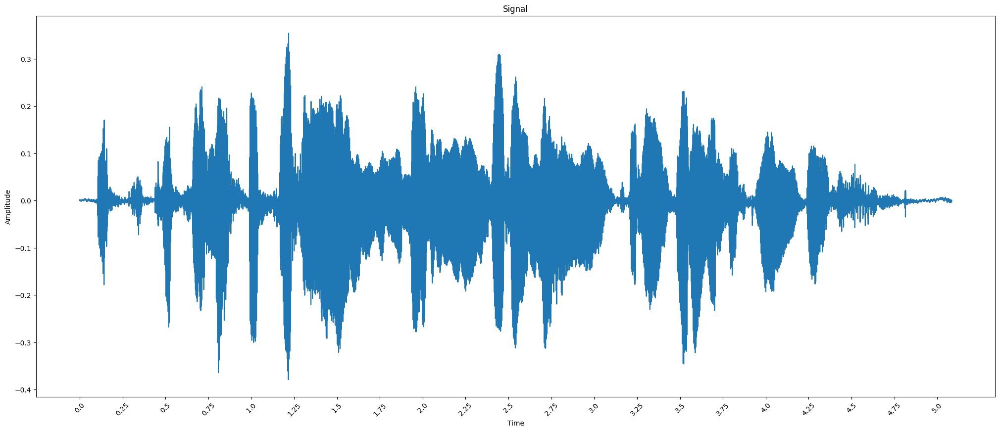

In [56]:
plot_wave(waveform=waveform_neu)

Shape of waveform: 322496
Sample rate of waveform: 16000


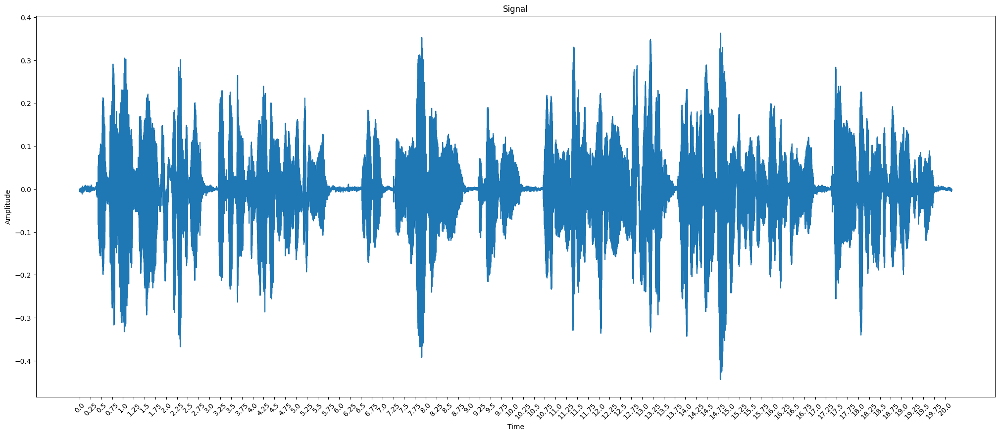

In [55]:
sample_2 = './data/KEMDy20_v1_1/wav/Session01/Sess01_script03_User001F_008.wav'
waveform_happy, sample_rate = librosa.load(sample_2, sr = SAMPLE_RATE) # SAMPLE_RATE = 16000

print("Shape of waveform: {}".format(waveform_happy.size))
print("Sample rate of waveform: {}".format(sample_rate))

plot_wave(waveform=waveform_happy)
#display(Audio(waveform_austrailia, rate=sample_rate))

Shape of waveform: 69968
Sample rate of waveform: 16000


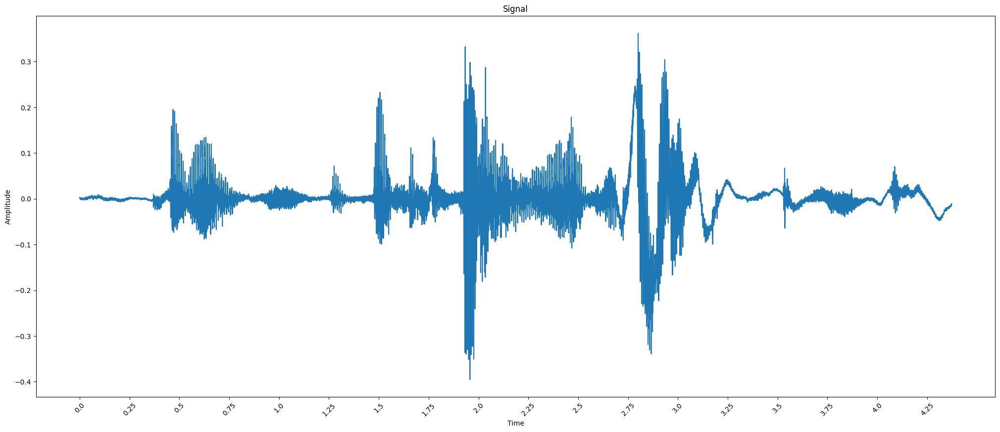

In [57]:
sample_2 = './data/KEMDy20_v1_1/wav/Session01/Sess01_script03_User002M_024.wav'
waveform_happy_m, sample_rate = librosa.load(sample_2, sr = SAMPLE_RATE) # SAMPLE_RATE = 16000

print("Shape of waveform: {}".format(waveform_happy_m.size))
print("Sample rate of waveform: {}".format(sample_rate))

plot_wave(waveform=waveform_happy_m)
#display(Audio(waveform_austrailia, rate=sample_rate))

Shape of waveform: 92112
Sample rate of waveform: 16000


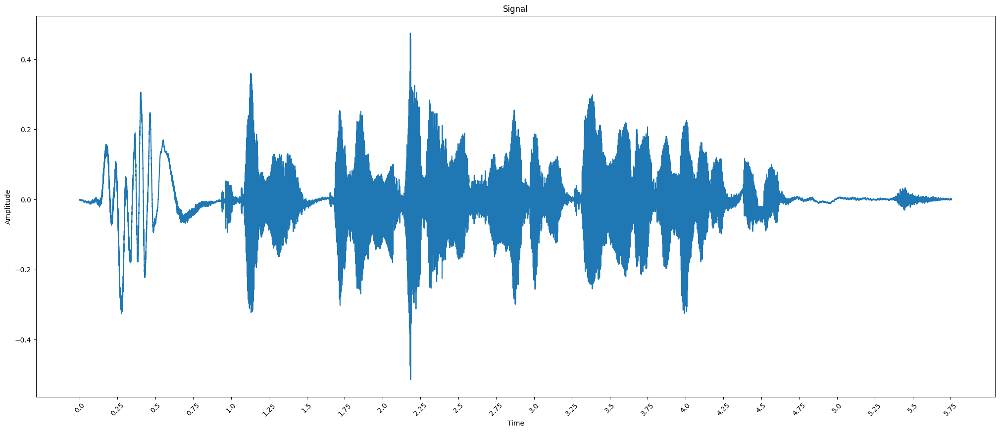

In [58]:
sample_3 = './data/KEMDy20_v1_1/wav/Session01/Sess01_script03_User001F_011.wav'
waveform_happy_f, sample_rate = librosa.load(sample_3, sr = SAMPLE_RATE) # SAMPLE_RATE = 16000

print("Shape of waveform: {}".format(waveform_happy_f.size))
print("Sample rate of waveform: {}".format(sample_rate))

plot_wave(waveform=waveform_happy_f)
#display(Audio(waveform_austrailia, rate=sample_rate))

In [ ]:
print('행복_sample_1')
plot_wave(waveform=waveform_happy)

print('슬픔_sample_1')
plot_wave(waveform=waveform_sad)

### Fourier Transform

- 입력 신호를 다양한 주파수를 가지는 주기함수들로 분해하는 것
- 주기함수들을 분해함으로써 음성데이터에서 노이즈 및 배경소리로부터 실제로 유용한 소리의 데이터(특징)를 추출하는 것
- FFT(Fast Fourier Transform, 고속 푸리에 변환) 를 통해 원본 소리 데이터를 형성하는 주파수(frequency)의 정도를 파악하고 시각화

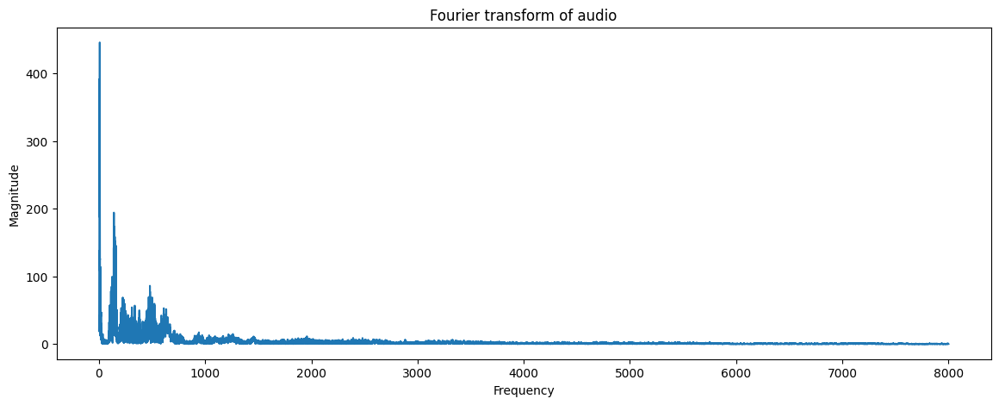

In [59]:
SAMPLE_RATE = 16000

sample_1 = './data/KEMDy20_v1_1/wav/Session01/Sess01_script03_User002M_024.wav'
data_happy, sample_rate = librosa.load(sample_1, sr = SAMPLE_RATE) # SAMPLE_RATE = 16000

fft = np.fft.fft(data_happy)

magnitude = np.abs(fft)
frequency = np.linspace(0, sample_rate, len(magnitude))

left_frequency = frequency[:int(len(frequency)/2)]
left_magnitude = magnitude[:int(len(magnitude)/2)]

fig = plt.figure(figsize = (14,5))
plt.plot(left_frequency, left_magnitude)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Fourier transform of audio")
plt.show()

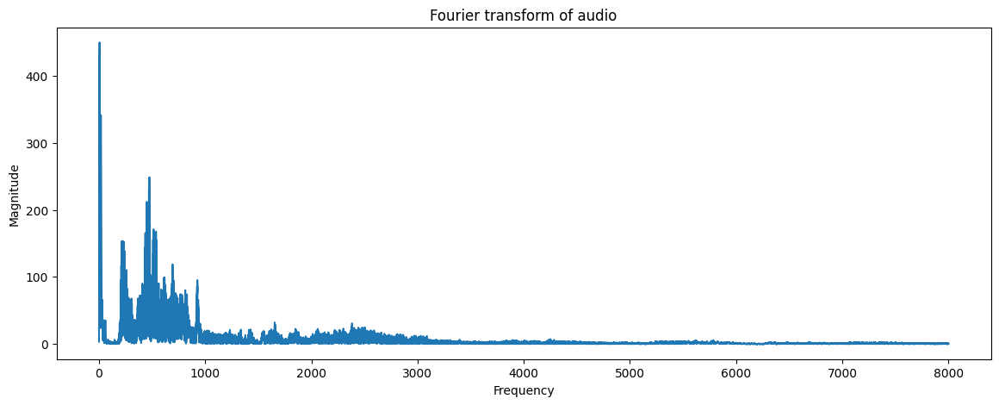

In [60]:
SAMPLE_RATE = 16000

sample_2 = './data/KEMDy20_v1_1/wav/Session01/Sess01_script03_User001F_011.wav'
data_sad, sample_rate = librosa.load(sample_2, sr = SAMPLE_RATE) # SAMPLE_RATE = 16000

fft = np.fft.fft(data_sad)

magnitude = np.abs(fft)
frequency = np.linspace(0, sample_rate, len(magnitude))

left_frequency = frequency[:int(len(frequency)/2)]
left_magnitude = magnitude[:int(len(magnitude)/2)]

fig = plt.figure(figsize = (14,5))
plt.plot(left_frequency, left_magnitude)
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.title("Fourier transform of audio")
plt.show()

### Mel-spectrogram
- Spectogram은 소리나 파동을 시각화하여 파악하기 위한 도구로, 파형(waveform)과 스펙트럼(spectrum)의 특징이 조합되어있음
- Mel Spectogram은 주파수를 mel-scale로 변환한 형태임
- 낮은 주파수를 높은 주파수보다 더 예민하게 받아들이므로 이 주파수를 mel scale로 볼 수 있게 하는 방법임

[**참고**]
#### Mel-scale
Mel은 사람의 달팽이관을 모티브로 따온 값입니다.

달팽이관은 주파수가 낮은 대역에서는 변화하는 주파수를 잘 감지하는데,

주파수가 높은 대역에서는 주파수 감지를 잘 하지 못합니다. (주파수 간격이 넓어짐)

이러한 원리를 이용해서 filter, scaling 해줄 수 있는데, 이때 이 기준을 Mel-Scale 이라고 합니다.

#### Argument
n_fft : 한 번 fft를 해 줄 만큼의 sequence 길이

여기서 n_fft는 window size라고도 부르는데, frame의 length를 결정하는 파라미터 입니다.

사람의 목소리는 대부분 16000Hz 안에 포함이 되는데,

일반적으로 자연어 처리에서는 음성을 25m의 크기를 기본으로 하고 있습니다.

따라서 16000Hz인 음성에서는 25m의 음성의 크기를 가지고 있으면 n_fft는 16000 * 0.025 = 400 (sampling rate * frame_length = n_fft)가 됩니다.

hop_length : window 간의 거리

hop_length도 마찬가지로 window 간의 거리이므로 sampling rate * frame_stride 가 됩니다.

win_length : 윈도우 길이

보통 win_length를 지정하지 않으면 n_fft가 됩니다.

Wav length: 4.373, Mel_S shape:(100, 438)


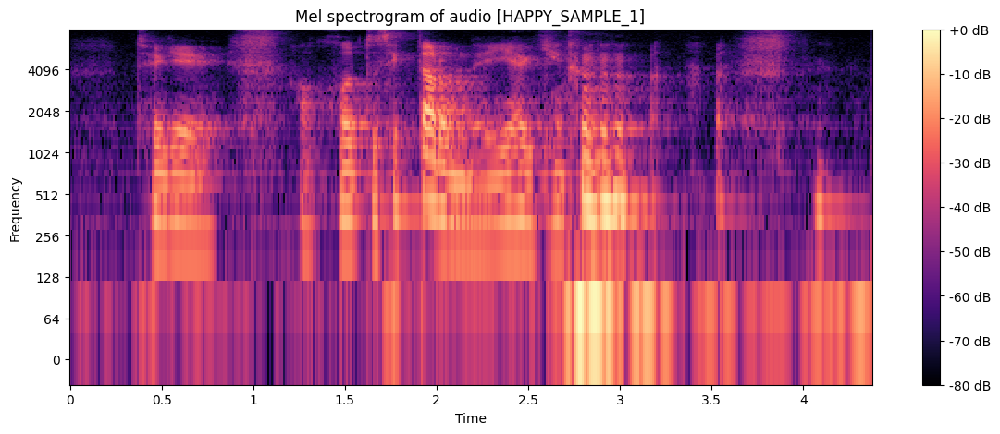

In [61]:
sr=16000
frame_length=0.025
frame_stride=0.010

sample_1 = './data/KEMDy20_v1_1/wav/Session01/Sess01_script03_User002M_024.wav'
data_happy, sample_rate = librosa.load(sample_1, sr=sr) # SAMPLE_RATE = 16000

input_nfft = int(round(sr*frame_length))
input_stride = int(round(sr*frame_stride))

S = librosa.feature.melspectrogram(y=data_happy, n_mels=100, n_fft=input_nfft, hop_length=input_stride)

print("Wav length: {}, Mel_S shape:{}".format(len(data_happy)/sample_rate, np.shape(S)))

S_dB  = librosa.power_to_db(S, ref=np.max)
fig = plt.figure(figsize = (14,5))
librosa.display.specshow(S_dB, 
                         sr=sample_rate, 
                         hop_length=input_stride,
                         x_axis='time',
                         y_axis='log')
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format='%+2.0f dB')
plt.title("Mel spectrogram of audio [HAPPY_SAMPLE_1]")
plt.show()

Wav length: 5.757, Mel_S shape:(100, 576)


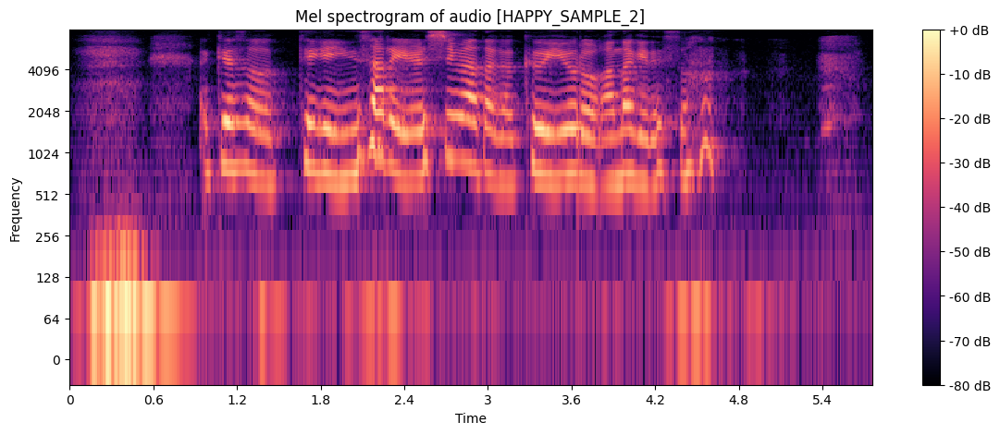

In [62]:
sr=16000
frame_length=0.025
frame_stride=0.010

sample_2 = './data/KEMDy20_v1_1/wav/Session01/Sess01_script03_User001F_011.wav'
data_sad, sample_rate = librosa.load(sample_2, sr = sr) # SAMPLE_RATE = 16000

input_nfft = int(round(sr*frame_length))
input_stride = int(round(sr*frame_stride))

S = librosa.feature.melspectrogram(y=data_sad, n_mels=100, n_fft=input_nfft, hop_length=input_stride)

print("Wav length: {}, Mel_S shape:{}".format(len(data_sad)/sample_rate, np.shape(S)))

S_dB  = librosa.power_to_db(S, ref=np.max)
fig = plt.figure(figsize = (14,5))
librosa.display.specshow(S_dB, 
                         sr=sample_rate, 
                         hop_length=input_stride,
                         x_axis='time',
                         y_axis='log')
plt.xlabel("Time")
plt.ylabel("Frequency")
plt.colorbar(format='%+2.0f dB')
plt.title("Mel spectrogram of audio [HAPPY_SAMPLE_2]")
plt.show()

In [ ]:
def Mel_S(file_path):
    
    sr=16000
    frame_length=0.025
    frame_stride=0.010

    data, sample_rate = librosa.load(file_path, sr = sr) # SAMPLE_RATE = 16000

    input_nfft = int(round(sr*frame_length))
    input_stride = int(round(sr*frame_stride))

    S = librosa.feature.melspectrogram(y=data, n_mels=100, n_fft=input_nfft, hop_length=input_stride)

    print("Wav length: {}, Mel_S shape:{}".format(len(data)/sample_rate, np.shape(S)))

    S_dB  = librosa.power_to_db(S, ref=np.max)
    fig = plt.figure(figsize = (14,5))
    librosa.display.specshow(S_dB, 
                             sr=sample_rate, 
                             hop_length=input_stride,
                             x_axis='time',
                             y_axis='log')
    plt.xlabel("Time")
    plt.ylabel("Frequency")
    plt.colorbar(format='%+2.0f dB')
    plt.title("Mel spectrogram of audio")
    plt.show()

In [ ]:
happy_sample = 'C:/Users/user/Desktop/Master Univ/Project/AI음성분류/음성감정분류/2023/data/행복_M/M_000085.wav'
sad_sample = 'C:/Users/user/Desktop/Master Univ/Project/AI음성분류/음성감정분류/2023/data/슬픔_M/M_000674.wav'

print(Mel_S(happy_sample))
print(Mel_S(sad_sample))

In [ ]:
sad_files_paths = glob("C:/Users/user/Desktop/Master Univ/Project/AI음성분류/음성감정분류/2023/data/슬픔_M/*.wav")


for file_path in sad_files_paths:
    print(Mel_S(file_path))

### TSNE

In [3]:
cd ..

C:\Users\enech\OneDrive\바탕 화면\Master_Univ\Project\AI음성분류\ETRI_competition


In [4]:
annot = pd.read_csv('./data/KEMDy20_v1_1/merged_annotations.csv')
annot

,Unnamed: 0,Numb,WAV,,Segment ID,Emotion,Valence,Arousal,Eval01F,.3,...,.16,Eval08M,.17,.18,Eval09F,.19,.20,Eval10M,.21,.22
0,1,1,3.578390,11.637391,Sess01_script01_User002M_001,neutral,3.4,2.9,neutral,3,...,3,neutral,4,3,neutral,3,3,neutral,3,3
1,2,2,11.637391,23.334393,Sess01_script01_User002M_002,neutral,3.1,2.9,neutral,3,...,3,neutral,4,3,neutral,3,3,neutral,3,3
2,3,3,23.334393,31.558392,Sess01_script01_User002M_003,neutral,3.1,3.0,neutral,3,...,3,neutral,4,3,neutral,3,3,neutral,3,3
3,4,4,31.558392,42.970390,Sess01_script01_User002M_004,neutral,3.7,3.1,neutral,4,...,3,neutral,4,4,neutral,3,3,neutral,4,3
4,5,5,42.777290,44.863290,Sess01_script01_User001F_001,neutral,3.8,2.8,happy,5,...,2,neutral,4,3,neutral,3,3,happy,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13457,494,494,289.449980,294.943000,Sess40_script06_User079F_043,neutral,3.0,3.5,neutral,3,...,4,neutral,3,4,neutral,3,4,neutral,3,4
13458,495,495,294.943000,297.598000,Sess40_script06_User079F_044,neutral,2.9,3.1,neutral,3,...,3,neutral,3,3,neutral,3,4,neutral,2,4
13459,496,496,297.598000,304.171000,Sess40_script06_User079F_045,neutral,2.6,3.6,neutral,2,...,4,neutral,2,4,fear,2,4,neutral,3,4
13460,497,497,304.171000,306.863000,Sess40_script06_User079F_046,neutral,2.7,3.3,disgust,2,...,4,neutral,2,3,neutral,2,4,surprise,3,4


In [5]:
annot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13462 entries, 0 to 13461
Data columns (total 38 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  13462 non-null  int64  
 1   Numb        13462 non-null  int64  
 2   WAV         13462 non-null  float64
 3               13462 non-null  float64
 4   Segment ID  13462 non-null  object 
 5   Emotion     13462 non-null  object 
 6   Valence     13462 non-null  float64
 7   Arousal     13462 non-null  float64
 8   Eval01F     13462 non-null  object 
 9    .3         13462 non-null  int64  
 10   .4         13462 non-null  int64  
 11  Eval02M     13462 non-null  object 
 12   .5         13462 non-null  int64  
 13   .6         13462 non-null  int64  
 14  Eval03M     13462 non-null  object 
 15   .7         13462 non-null  int64  
 16   .8         13462 non-null  int64  
 17  Eval04F     13462 non-null  object 
 18   .9         13462 non-null  int64  
 19   .10        13462 non-nul

In [10]:
from sklearn.manifold import TSNE

train_df = annot[['Valence', 'Arousal']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

In [11]:
tsne_df

,component 0,component 1
0,-6.850379,82.651146
1,-91.532265,-18.482464
2,48.236530,-9.321924
3,4.791035,-21.948282
4,-3.140718,0.967037
...,...,...
13457,-36.653934,94.276108
13458,-6.750339,-28.249670
13459,3.347821,-60.672962
13460,-86.383476,19.680962


In [14]:
emotion_split = annot['Emotion'].str.split(";")

annot['Emotion_2'] = emotion_split.str.get(0)

print(annot['Emotion_2'].value_counts())

neutral     11249
happy        1543
angry         233
surprise      212
sad           121
disqust        61
fear           43
Name: Emotion_2, dtype: int64


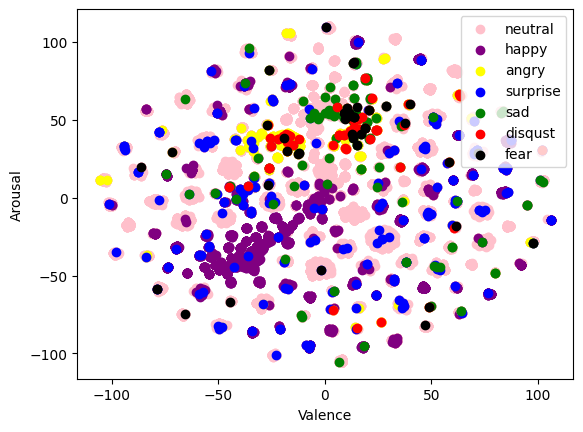

In [15]:
import matplotlib.pyplot as plt

tsne_df['target'] = annot['Emotion_2']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

### What about each annotator?

In [6]:
from sklearn.manifold import TSNE

train_df = annot[[' .3', ' .4']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

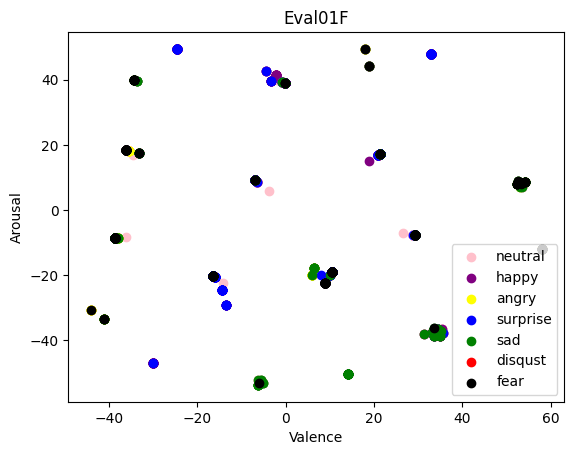

In [8]:
import matplotlib.pyplot as plt

tsne_df['target'] = annot['Eval01F']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval01F')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

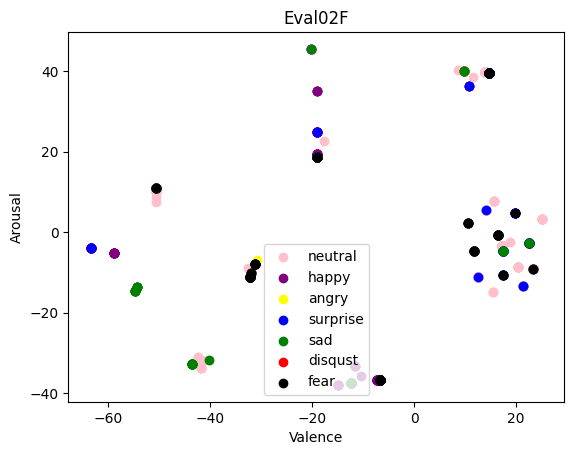

In [10]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .5', ' .6']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval02M']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval02F')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

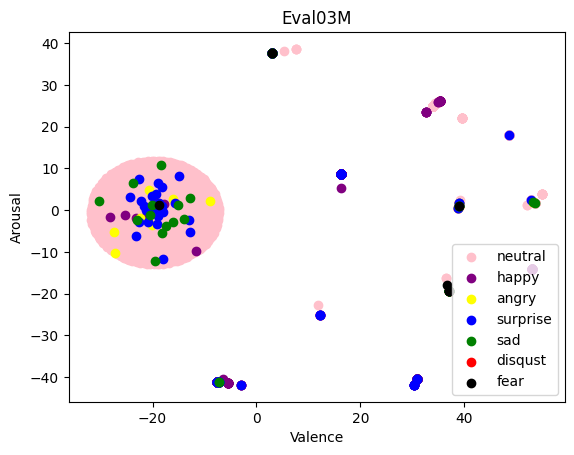

In [12]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .7', ' .8']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval03M']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval03M')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

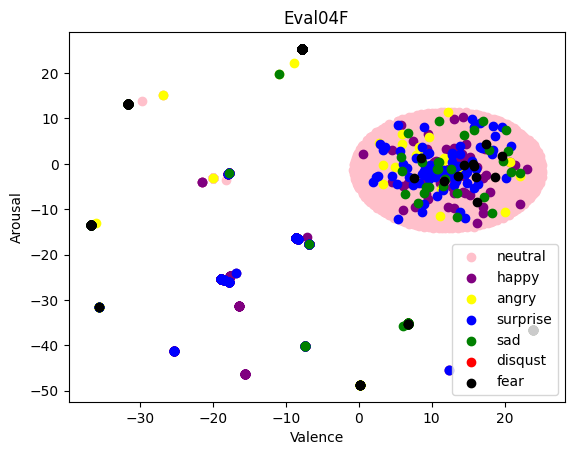

In [13]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .9', ' .10']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval04F']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval04F')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

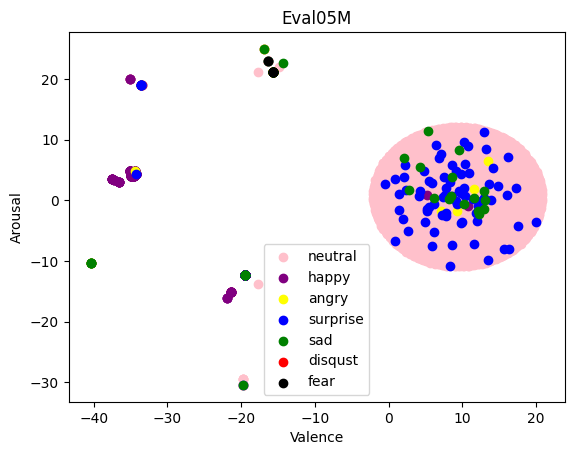

In [14]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .11', ' .12']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval05M']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval05M')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

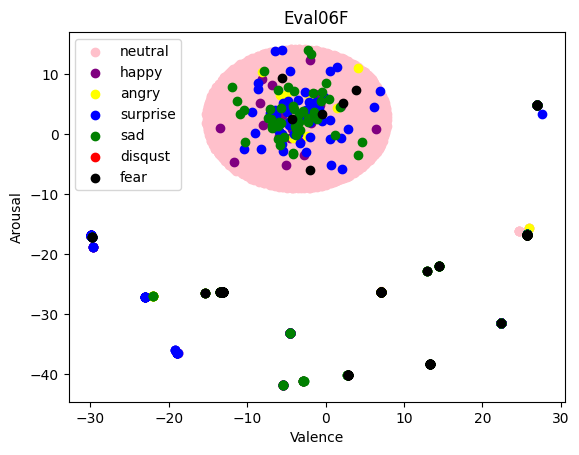

In [18]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .13',' .14']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval06F']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval06F')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

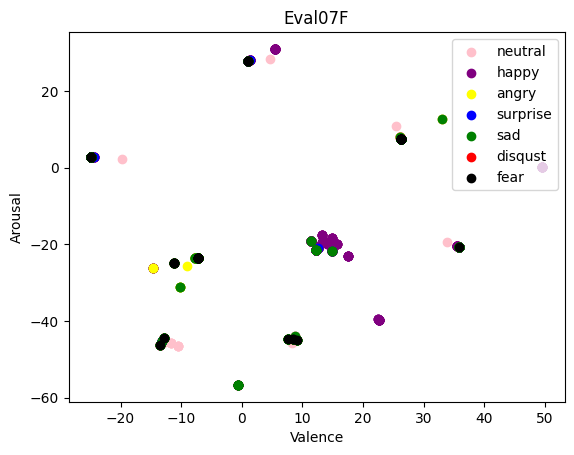

In [19]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .15',' .16']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval07F']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval07F')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

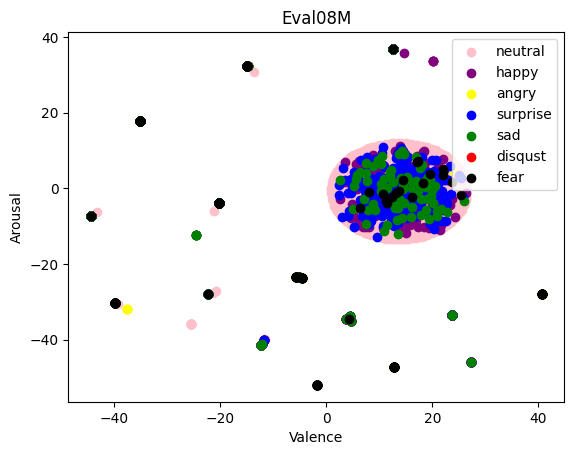

In [20]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .17',' .18']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval08M']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval08M')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

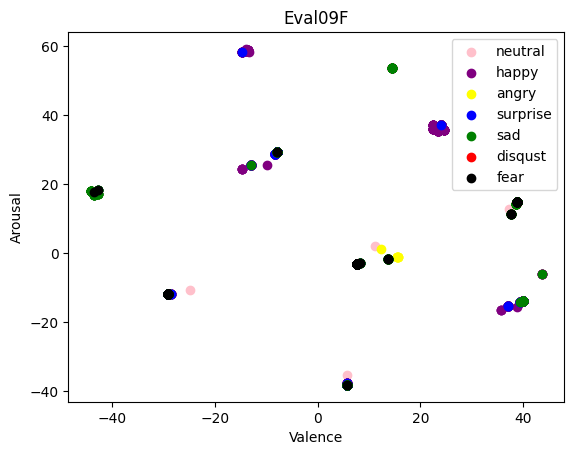

In [21]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .19',' .20']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval09F']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval09F')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()

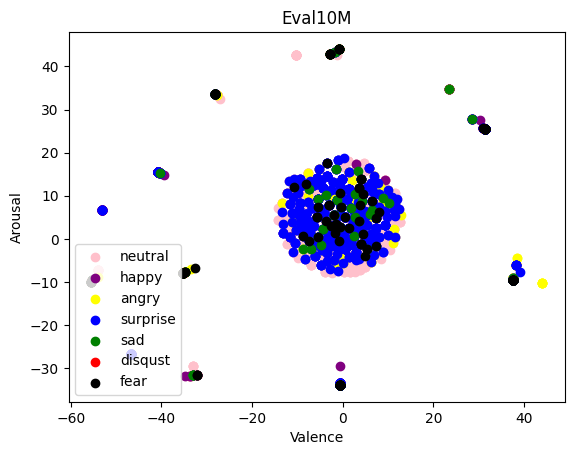

In [22]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

train_df = annot[[' .21',' .22']]

#2차원 t-SNE 임베딩
tsne_np = TSNE(n_components=2).fit_transform(train_df)

tsne_df = pd.DataFrame(tsne_np, columns=['component 0', 'component 1'])

tsne_df['target'] = annot['Eval10M']

# target 별 분리
tsne_df_0 = tsne_df[tsne_df['target'] == "neutral"]
tsne_df_1 = tsne_df[tsne_df['target'] == "happy"]
tsne_df_2 = tsne_df[tsne_df['target'] == "angry"]
tsne_df_3 = tsne_df[tsne_df['target'] == "surprise"]
tsne_df_4 = tsne_df[tsne_df['target'] == "sad"]
tsne_df_5 = tsne_df[tsne_df['target'] == "disqust"]
tsne_df_6 = tsne_df[tsne_df['target'] == "fear"]

# target 별 시각화
plt.scatter(tsne_df_0['component 0'], tsne_df_0['component 1'], color = 'pink', label = 'neutral')
plt.scatter(tsne_df_1['component 0'], tsne_df_1['component 1'], color = 'purple', label = 'happy')
plt.scatter(tsne_df_2['component 0'], tsne_df_2['component 1'], color = 'yellow', label = 'angry')
plt.scatter(tsne_df_3['component 0'], tsne_df_3['component 1'], color = 'blue', label = 'surprise')
plt.scatter(tsne_df_4['component 0'], tsne_df_4['component 1'], color = 'green', label = 'sad')
plt.scatter(tsne_df_5['component 0'], tsne_df_5['component 1'], color = 'red', label = 'disqust')
plt.scatter(tsne_df_6['component 0'], tsne_df_6['component 1'], color = 'black', label = 'fear')

plt.title('Eval10M')
plt.xlabel('Valence')
plt.ylabel('Arousal')
plt.legend()
plt.show()